# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

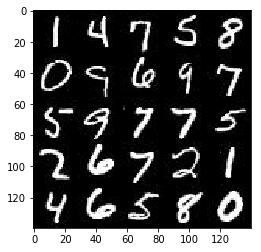

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

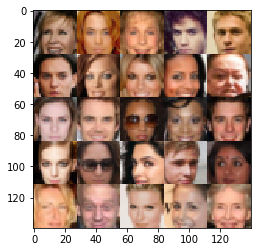

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_ph = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels))
    z_ph = tf.placeholder(tf.float32, shape=(None, z_dim))
    lr_ph = tf.placeholder(tf.float32)
    return input_ph, z_ph, lr_ph


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope("discriminator", reuse = reuse):
        #alpha is the param for leaky relu
        alpha=0.2
        
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.05))
        n1 = tf.layers.batch_normalization(x1, training=True)
        relu1 = tf.maximum(alpha * n1, n1)
        #16x16x128
        
        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.05))
        n2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * n2, n2)
        #8x8x256
        
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.05))
        n3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * n3, n3)
        #4x4x512

        flat = tf.contrib.layers.flatten(relu3)
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse=not is_train):
        x1 = tf.layers.dense(z, 7*7*512, activation=None)

        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same', activation=None)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=1, padding='same', activation=None)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same', activation=None)
        
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)

    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    #Optimize
    
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list=d_vars)
    
    # Tell TensorFlow to update the population statistics while training
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height,image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    is_train = tf.placeholder(tf.bool)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                 # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                #_ = sess.run(g_opt, feed_dict={input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate,is_train:True})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate,is_train:False})
                
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 100 == 0:
                    #Print the current image
                    show_generator_output(sess, 50, input_z, image_channels, data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 3.9891... Generator Loss: 0.0257
Epoch 1/2... Discriminator Loss: 3.4557... Generator Loss: 0.1066
Epoch 1/2... Discriminator Loss: 3.4546... Generator Loss: 0.0481
Epoch 1/2... Discriminator Loss: 3.9654... Generator Loss: 0.0282
Epoch 1/2... Discriminator Loss: 3.7290... Generator Loss: 0.0525
Epoch 1/2... Discriminator Loss: 3.0565... Generator Loss: 0.0922
Epoch 1/2... Discriminator Loss: 3.0047... Generator Loss: 0.0948
Epoch 1/2... Discriminator Loss: 2.8915... Generator Loss: 0.1431
Epoch 1/2... Discriminator Loss: 2.6631... Generator Loss: 0.2115
Epoch 1/2... Discriminator Loss: 2.3759... Generator Loss: 0.1598


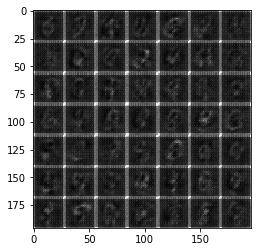

Epoch 1/2... Discriminator Loss: 2.3240... Generator Loss: 0.1682
Epoch 1/2... Discriminator Loss: 2.4334... Generator Loss: 0.1786
Epoch 1/2... Discriminator Loss: 2.1063... Generator Loss: 0.2168
Epoch 1/2... Discriminator Loss: 2.1018... Generator Loss: 0.2743
Epoch 1/2... Discriminator Loss: 2.3150... Generator Loss: 0.3254
Epoch 1/2... Discriminator Loss: 1.8358... Generator Loss: 0.3709
Epoch 1/2... Discriminator Loss: 2.2640... Generator Loss: 0.2996
Epoch 1/2... Discriminator Loss: 2.3681... Generator Loss: 0.1378
Epoch 1/2... Discriminator Loss: 2.1216... Generator Loss: 0.2543
Epoch 1/2... Discriminator Loss: 2.1792... Generator Loss: 0.4925


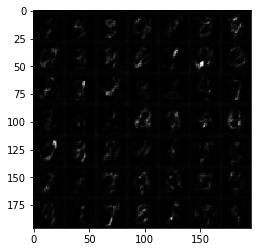

Epoch 1/2... Discriminator Loss: 2.2029... Generator Loss: 0.1896
Epoch 1/2... Discriminator Loss: 2.1259... Generator Loss: 0.2164
Epoch 1/2... Discriminator Loss: 1.9966... Generator Loss: 0.2526
Epoch 1/2... Discriminator Loss: 2.1306... Generator Loss: 0.1822
Epoch 1/2... Discriminator Loss: 1.5913... Generator Loss: 0.4578
Epoch 1/2... Discriminator Loss: 1.8557... Generator Loss: 0.3331
Epoch 1/2... Discriminator Loss: 1.8697... Generator Loss: 0.2319
Epoch 1/2... Discriminator Loss: 2.1124... Generator Loss: 0.1644
Epoch 1/2... Discriminator Loss: 1.5481... Generator Loss: 0.5221
Epoch 1/2... Discriminator Loss: 1.8424... Generator Loss: 0.2728


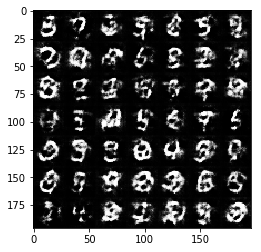

Epoch 1/2... Discriminator Loss: 1.6899... Generator Loss: 0.5477
Epoch 1/2... Discriminator Loss: 2.1120... Generator Loss: 0.1946
Epoch 1/2... Discriminator Loss: 1.6216... Generator Loss: 0.3338
Epoch 1/2... Discriminator Loss: 2.2330... Generator Loss: 0.1737
Epoch 1/2... Discriminator Loss: 2.1019... Generator Loss: 0.3084
Epoch 1/2... Discriminator Loss: 2.0189... Generator Loss: 0.2573
Epoch 1/2... Discriminator Loss: 1.8016... Generator Loss: 0.4267
Epoch 1/2... Discriminator Loss: 1.5098... Generator Loss: 0.4582
Epoch 1/2... Discriminator Loss: 2.0385... Generator Loss: 0.2125
Epoch 1/2... Discriminator Loss: 1.8432... Generator Loss: 0.5780


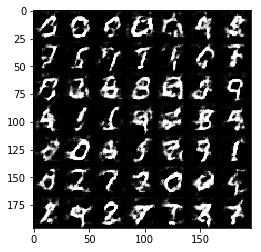

Epoch 1/2... Discriminator Loss: 2.4939... Generator Loss: 0.1116
Epoch 1/2... Discriminator Loss: 2.2228... Generator Loss: 0.2110
Epoch 1/2... Discriminator Loss: 1.7331... Generator Loss: 0.2940
Epoch 1/2... Discriminator Loss: 1.7203... Generator Loss: 0.4019
Epoch 1/2... Discriminator Loss: 1.8516... Generator Loss: 0.2657
Epoch 1/2... Discriminator Loss: 2.2830... Generator Loss: 0.1413
Epoch 1/2... Discriminator Loss: 1.7725... Generator Loss: 0.3769
Epoch 1/2... Discriminator Loss: 1.5952... Generator Loss: 0.3829
Epoch 1/2... Discriminator Loss: 1.8365... Generator Loss: 0.3882
Epoch 1/2... Discriminator Loss: 1.5569... Generator Loss: 0.4065


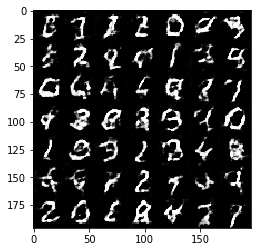

Epoch 1/2... Discriminator Loss: 1.8248... Generator Loss: 0.2627
Epoch 1/2... Discriminator Loss: 1.8425... Generator Loss: 0.2875
Epoch 1/2... Discriminator Loss: 1.8900... Generator Loss: 0.3505
Epoch 1/2... Discriminator Loss: 1.7642... Generator Loss: 0.3479
Epoch 1/2... Discriminator Loss: 1.6864... Generator Loss: 0.3341
Epoch 1/2... Discriminator Loss: 1.5653... Generator Loss: 0.6405
Epoch 1/2... Discriminator Loss: 1.6452... Generator Loss: 0.5251
Epoch 1/2... Discriminator Loss: 2.0481... Generator Loss: 0.2173
Epoch 1/2... Discriminator Loss: 1.9554... Generator Loss: 0.2952
Epoch 1/2... Discriminator Loss: 2.1826... Generator Loss: 0.2311


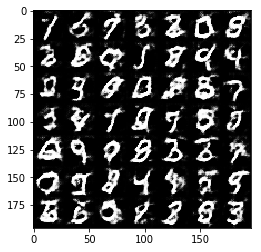

Epoch 1/2... Discriminator Loss: 1.6371... Generator Loss: 0.6875
Epoch 1/2... Discriminator Loss: 2.2587... Generator Loss: 0.1520
Epoch 1/2... Discriminator Loss: 1.7120... Generator Loss: 0.3122
Epoch 1/2... Discriminator Loss: 1.7508... Generator Loss: 0.5554
Epoch 1/2... Discriminator Loss: 1.9430... Generator Loss: 0.3508
Epoch 1/2... Discriminator Loss: 1.7248... Generator Loss: 0.3169
Epoch 1/2... Discriminator Loss: 1.7974... Generator Loss: 0.3027
Epoch 1/2... Discriminator Loss: 2.1041... Generator Loss: 0.1982
Epoch 1/2... Discriminator Loss: 1.5525... Generator Loss: 0.5235
Epoch 1/2... Discriminator Loss: 2.0240... Generator Loss: 0.2354


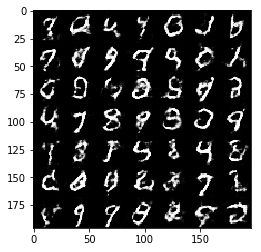

Epoch 1/2... Discriminator Loss: 1.9307... Generator Loss: 0.3085
Epoch 1/2... Discriminator Loss: 1.7234... Generator Loss: 0.3818
Epoch 1/2... Discriminator Loss: 1.7109... Generator Loss: 0.3338
Epoch 1/2... Discriminator Loss: 2.0711... Generator Loss: 0.2132
Epoch 1/2... Discriminator Loss: 2.0925... Generator Loss: 0.1877
Epoch 1/2... Discriminator Loss: 1.5884... Generator Loss: 0.4591
Epoch 1/2... Discriminator Loss: 1.5309... Generator Loss: 0.4401
Epoch 1/2... Discriminator Loss: 1.8476... Generator Loss: 0.2120
Epoch 1/2... Discriminator Loss: 1.4985... Generator Loss: 0.4282
Epoch 1/2... Discriminator Loss: 1.3842... Generator Loss: 0.8392


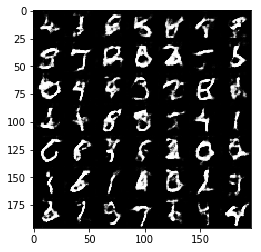

Epoch 1/2... Discriminator Loss: 1.9491... Generator Loss: 0.2840
Epoch 1/2... Discriminator Loss: 1.4268... Generator Loss: 0.5298
Epoch 1/2... Discriminator Loss: 1.2514... Generator Loss: 0.6160
Epoch 1/2... Discriminator Loss: 1.5968... Generator Loss: 0.5356
Epoch 1/2... Discriminator Loss: 1.6059... Generator Loss: 0.4375
Epoch 1/2... Discriminator Loss: 1.4956... Generator Loss: 0.6130
Epoch 1/2... Discriminator Loss: 1.3422... Generator Loss: 0.9102
Epoch 1/2... Discriminator Loss: 1.5778... Generator Loss: 0.3890
Epoch 1/2... Discriminator Loss: 2.2574... Generator Loss: 0.1594
Epoch 1/2... Discriminator Loss: 1.8546... Generator Loss: 0.3195


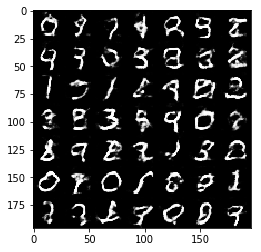

Epoch 1/2... Discriminator Loss: 1.8392... Generator Loss: 0.2162
Epoch 1/2... Discriminator Loss: 1.4524... Generator Loss: 0.4461
Epoch 1/2... Discriminator Loss: 1.5225... Generator Loss: 0.4731
Epoch 1/2... Discriminator Loss: 1.7924... Generator Loss: 0.3055
Epoch 1/2... Discriminator Loss: 1.7888... Generator Loss: 0.2750
Epoch 1/2... Discriminator Loss: 1.4542... Generator Loss: 0.4294
Epoch 1/2... Discriminator Loss: 1.6374... Generator Loss: 0.4499
Epoch 1/2... Discriminator Loss: 1.4250... Generator Loss: 0.5184
Epoch 1/2... Discriminator Loss: 1.6026... Generator Loss: 0.3675
Epoch 1/2... Discriminator Loss: 1.5341... Generator Loss: 0.4780


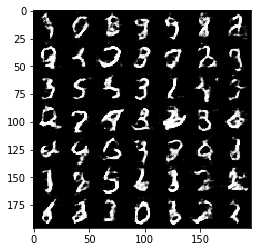

Epoch 1/2... Discriminator Loss: 1.6501... Generator Loss: 0.3052
Epoch 1/2... Discriminator Loss: 1.5326... Generator Loss: 0.4817
Epoch 1/2... Discriminator Loss: 1.8521... Generator Loss: 0.2638
Epoch 1/2... Discriminator Loss: 1.7608... Generator Loss: 0.3408
Epoch 1/2... Discriminator Loss: 1.4607... Generator Loss: 0.4848
Epoch 1/2... Discriminator Loss: 1.6971... Generator Loss: 0.3184
Epoch 1/2... Discriminator Loss: 1.4633... Generator Loss: 0.5588
Epoch 1/2... Discriminator Loss: 1.8167... Generator Loss: 0.2450
Epoch 1/2... Discriminator Loss: 1.6299... Generator Loss: 0.7355
Epoch 1/2... Discriminator Loss: 2.0137... Generator Loss: 0.2414


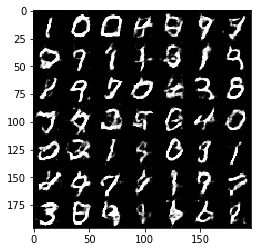

Epoch 1/2... Discriminator Loss: 1.4786... Generator Loss: 0.4539
Epoch 1/2... Discriminator Loss: 1.4991... Generator Loss: 0.5006
Epoch 1/2... Discriminator Loss: 1.6329... Generator Loss: 0.3449
Epoch 1/2... Discriminator Loss: 1.7042... Generator Loss: 0.2899
Epoch 1/2... Discriminator Loss: 1.6231... Generator Loss: 0.3715
Epoch 1/2... Discriminator Loss: 1.7848... Generator Loss: 0.3717
Epoch 1/2... Discriminator Loss: 1.6805... Generator Loss: 0.4164
Epoch 1/2... Discriminator Loss: 2.1589... Generator Loss: 0.1975
Epoch 1/2... Discriminator Loss: 1.4117... Generator Loss: 0.4925
Epoch 1/2... Discriminator Loss: 1.6479... Generator Loss: 0.6243


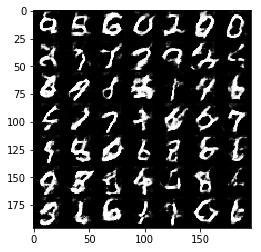

Epoch 1/2... Discriminator Loss: 1.4486... Generator Loss: 0.5544
Epoch 1/2... Discriminator Loss: 1.6210... Generator Loss: 0.4784
Epoch 1/2... Discriminator Loss: 1.6712... Generator Loss: 0.3561
Epoch 1/2... Discriminator Loss: 2.2122... Generator Loss: 0.1566
Epoch 1/2... Discriminator Loss: 1.5779... Generator Loss: 0.3606
Epoch 1/2... Discriminator Loss: 1.5866... Generator Loss: 0.3586
Epoch 1/2... Discriminator Loss: 1.8800... Generator Loss: 0.2784
Epoch 1/2... Discriminator Loss: 1.3016... Generator Loss: 0.5800
Epoch 1/2... Discriminator Loss: 1.7592... Generator Loss: 0.3216
Epoch 1/2... Discriminator Loss: 1.8778... Generator Loss: 0.2507


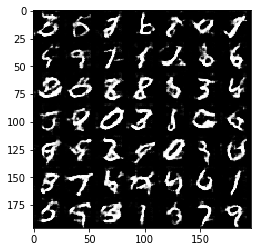

Epoch 1/2... Discriminator Loss: 1.6825... Generator Loss: 0.4846
Epoch 1/2... Discriminator Loss: 1.4421... Generator Loss: 0.4736
Epoch 1/2... Discriminator Loss: 1.6053... Generator Loss: 0.6809
Epoch 1/2... Discriminator Loss: 1.7127... Generator Loss: 0.4874
Epoch 1/2... Discriminator Loss: 1.8137... Generator Loss: 0.4857
Epoch 1/2... Discriminator Loss: 1.5886... Generator Loss: 0.4616
Epoch 1/2... Discriminator Loss: 1.3102... Generator Loss: 0.5543
Epoch 1/2... Discriminator Loss: 1.8864... Generator Loss: 0.2246
Epoch 1/2... Discriminator Loss: 1.8196... Generator Loss: 0.4067
Epoch 1/2... Discriminator Loss: 2.0744... Generator Loss: 0.1732


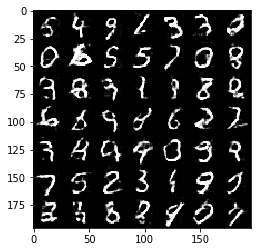

Epoch 1/2... Discriminator Loss: 1.6951... Generator Loss: 0.3036
Epoch 1/2... Discriminator Loss: 1.5925... Generator Loss: 0.3474
Epoch 1/2... Discriminator Loss: 1.6180... Generator Loss: 0.3683
Epoch 1/2... Discriminator Loss: 1.6153... Generator Loss: 0.6689
Epoch 1/2... Discriminator Loss: 1.6435... Generator Loss: 0.4237
Epoch 1/2... Discriminator Loss: 1.8053... Generator Loss: 0.3267
Epoch 1/2... Discriminator Loss: 1.3740... Generator Loss: 0.6549
Epoch 1/2... Discriminator Loss: 1.6523... Generator Loss: 0.3660
Epoch 1/2... Discriminator Loss: 1.5543... Generator Loss: 0.3537
Epoch 1/2... Discriminator Loss: 1.4958... Generator Loss: 0.4674


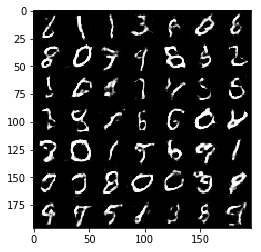

Epoch 1/2... Discriminator Loss: 1.4828... Generator Loss: 0.6723
Epoch 1/2... Discriminator Loss: 1.6636... Generator Loss: 0.5049
Epoch 1/2... Discriminator Loss: 1.6793... Generator Loss: 0.4071
Epoch 1/2... Discriminator Loss: 1.0981... Generator Loss: 0.6764
Epoch 1/2... Discriminator Loss: 1.5785... Generator Loss: 0.4258
Epoch 1/2... Discriminator Loss: 1.6844... Generator Loss: 0.3192
Epoch 1/2... Discriminator Loss: 1.6597... Generator Loss: 0.3901
Epoch 1/2... Discriminator Loss: 1.9082... Generator Loss: 0.2049
Epoch 1/2... Discriminator Loss: 1.7311... Generator Loss: 0.2924
Epoch 1/2... Discriminator Loss: 1.4114... Generator Loss: 0.4312


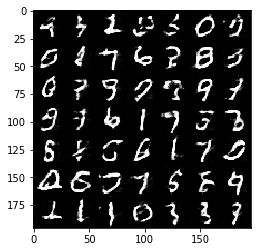

Epoch 1/2... Discriminator Loss: 1.9931... Generator Loss: 0.1807
Epoch 1/2... Discriminator Loss: 1.6314... Generator Loss: 0.5554
Epoch 1/2... Discriminator Loss: 1.5658... Generator Loss: 0.4803
Epoch 1/2... Discriminator Loss: 1.6411... Generator Loss: 0.6190
Epoch 1/2... Discriminator Loss: 1.5731... Generator Loss: 0.3861
Epoch 1/2... Discriminator Loss: 1.8312... Generator Loss: 0.2482
Epoch 1/2... Discriminator Loss: 1.4152... Generator Loss: 0.6755
Epoch 1/2... Discriminator Loss: 1.5286... Generator Loss: 0.3459
Epoch 1/2... Discriminator Loss: 1.5584... Generator Loss: 0.5144
Epoch 1/2... Discriminator Loss: 2.3193... Generator Loss: 0.1284


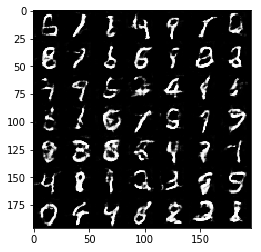

Epoch 1/2... Discriminator Loss: 1.6585... Generator Loss: 0.5424
Epoch 1/2... Discriminator Loss: 1.7183... Generator Loss: 0.3326
Epoch 1/2... Discriminator Loss: 1.2332... Generator Loss: 0.6234
Epoch 1/2... Discriminator Loss: 1.5607... Generator Loss: 0.3649
Epoch 1/2... Discriminator Loss: 1.3635... Generator Loss: 0.7457
Epoch 1/2... Discriminator Loss: 1.6567... Generator Loss: 0.3021
Epoch 1/2... Discriminator Loss: 1.5267... Generator Loss: 0.3928
Epoch 1/2... Discriminator Loss: 1.9401... Generator Loss: 0.2093
Epoch 1/2... Discriminator Loss: 1.2134... Generator Loss: 0.7762
Epoch 1/2... Discriminator Loss: 1.4043... Generator Loss: 0.6011


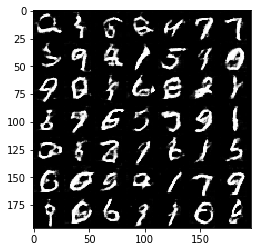

Epoch 1/2... Discriminator Loss: 1.4762... Generator Loss: 0.3567
Epoch 1/2... Discriminator Loss: 1.4771... Generator Loss: 0.6349
Epoch 1/2... Discriminator Loss: 1.2329... Generator Loss: 0.7459
Epoch 1/2... Discriminator Loss: 1.2984... Generator Loss: 0.6571
Epoch 1/2... Discriminator Loss: 1.3706... Generator Loss: 0.4852
Epoch 1/2... Discriminator Loss: 1.5262... Generator Loss: 0.3649
Epoch 1/2... Discriminator Loss: 2.0224... Generator Loss: 0.2062
Epoch 1/2... Discriminator Loss: 1.6173... Generator Loss: 0.4010
Epoch 1/2... Discriminator Loss: 1.5785... Generator Loss: 0.3341
Epoch 1/2... Discriminator Loss: 1.4190... Generator Loss: 0.4466


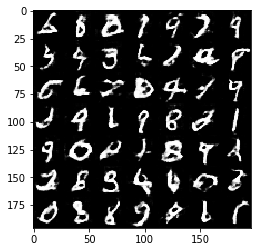

Epoch 1/2... Discriminator Loss: 1.3616... Generator Loss: 0.5350
Epoch 1/2... Discriminator Loss: 1.2952... Generator Loss: 0.5264
Epoch 1/2... Discriminator Loss: 1.2533... Generator Loss: 0.6532
Epoch 1/2... Discriminator Loss: 1.4792... Generator Loss: 0.8448
Epoch 1/2... Discriminator Loss: 1.2788... Generator Loss: 0.6421
Epoch 1/2... Discriminator Loss: 1.8269... Generator Loss: 0.2535
Epoch 1/2... Discriminator Loss: 1.5550... Generator Loss: 0.4391
Epoch 1/2... Discriminator Loss: 1.8158... Generator Loss: 0.2345
Epoch 1/2... Discriminator Loss: 1.5424... Generator Loss: 0.4687
Epoch 1/2... Discriminator Loss: 1.5819... Generator Loss: 0.4090


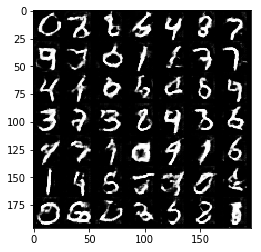

Epoch 1/2... Discriminator Loss: 1.6780... Generator Loss: 0.2908
Epoch 1/2... Discriminator Loss: 1.5184... Generator Loss: 0.4249
Epoch 1/2... Discriminator Loss: 1.5025... Generator Loss: 0.8054
Epoch 1/2... Discriminator Loss: 1.3101... Generator Loss: 0.5666
Epoch 1/2... Discriminator Loss: 1.3060... Generator Loss: 0.5664
Epoch 1/2... Discriminator Loss: 1.4233... Generator Loss: 0.4767
Epoch 1/2... Discriminator Loss: 2.0507... Generator Loss: 0.1828
Epoch 1/2... Discriminator Loss: 1.3291... Generator Loss: 0.7445
Epoch 1/2... Discriminator Loss: 1.9552... Generator Loss: 0.2348
Epoch 1/2... Discriminator Loss: 1.2848... Generator Loss: 0.6271


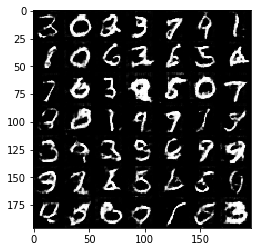

Epoch 1/2... Discriminator Loss: 1.3797... Generator Loss: 0.4523
Epoch 1/2... Discriminator Loss: 1.8296... Generator Loss: 0.2855
Epoch 1/2... Discriminator Loss: 1.4760... Generator Loss: 0.4151
Epoch 1/2... Discriminator Loss: 1.3374... Generator Loss: 0.4902
Epoch 1/2... Discriminator Loss: 1.5132... Generator Loss: 0.6766
Epoch 1/2... Discriminator Loss: 1.4118... Generator Loss: 0.3694
Epoch 1/2... Discriminator Loss: 1.4301... Generator Loss: 0.3985
Epoch 1/2... Discriminator Loss: 1.5032... Generator Loss: 0.3282
Epoch 1/2... Discriminator Loss: 1.7808... Generator Loss: 0.7274
Epoch 1/2... Discriminator Loss: 1.4054... Generator Loss: 0.4907


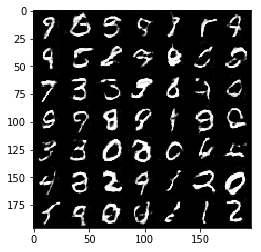

Epoch 1/2... Discriminator Loss: 2.3179... Generator Loss: 0.1204
Epoch 1/2... Discriminator Loss: 1.6780... Generator Loss: 0.2886
Epoch 1/2... Discriminator Loss: 1.7885... Generator Loss: 0.2557
Epoch 1/2... Discriminator Loss: 1.5893... Generator Loss: 0.3438
Epoch 1/2... Discriminator Loss: 1.4434... Generator Loss: 0.4802
Epoch 1/2... Discriminator Loss: 1.2753... Generator Loss: 1.0267
Epoch 1/2... Discriminator Loss: 1.3640... Generator Loss: 0.5313
Epoch 1/2... Discriminator Loss: 1.1895... Generator Loss: 0.9777
Epoch 1/2... Discriminator Loss: 1.2336... Generator Loss: 0.8373
Epoch 1/2... Discriminator Loss: 1.4652... Generator Loss: 0.3036


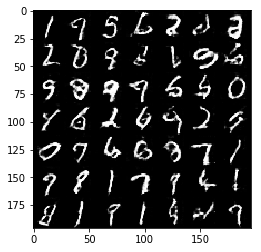

Epoch 1/2... Discriminator Loss: 1.4913... Generator Loss: 0.4361
Epoch 1/2... Discriminator Loss: 1.4531... Generator Loss: 0.4507
Epoch 1/2... Discriminator Loss: 1.3722... Generator Loss: 0.4112
Epoch 1/2... Discriminator Loss: 1.6838... Generator Loss: 0.4351
Epoch 1/2... Discriminator Loss: 1.6349... Generator Loss: 0.3456
Epoch 1/2... Discriminator Loss: 1.6349... Generator Loss: 0.2752
Epoch 1/2... Discriminator Loss: 1.7612... Generator Loss: 0.3752
Epoch 1/2... Discriminator Loss: 1.8177... Generator Loss: 0.2199
Epoch 1/2... Discriminator Loss: 1.0804... Generator Loss: 0.8440
Epoch 1/2... Discriminator Loss: 1.7582... Generator Loss: 0.4316


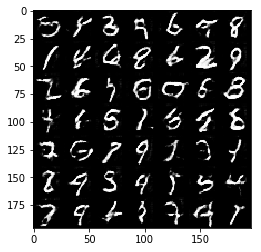

Epoch 1/2... Discriminator Loss: 1.4856... Generator Loss: 0.4876
Epoch 1/2... Discriminator Loss: 1.5094... Generator Loss: 0.5955
Epoch 1/2... Discriminator Loss: 1.3408... Generator Loss: 0.4650
Epoch 1/2... Discriminator Loss: 1.9962... Generator Loss: 0.7769
Epoch 1/2... Discriminator Loss: 1.5797... Generator Loss: 0.3058
Epoch 1/2... Discriminator Loss: 2.0767... Generator Loss: 0.1869
Epoch 1/2... Discriminator Loss: 1.1409... Generator Loss: 0.7038
Epoch 1/2... Discriminator Loss: 1.5782... Generator Loss: 0.4545
Epoch 1/2... Discriminator Loss: 1.4542... Generator Loss: 0.4885
Epoch 1/2... Discriminator Loss: 1.5646... Generator Loss: 0.3124


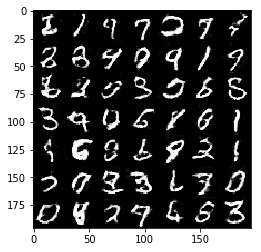

Epoch 1/2... Discriminator Loss: 1.5258... Generator Loss: 0.3460
Epoch 1/2... Discriminator Loss: 1.3260... Generator Loss: 0.4743
Epoch 1/2... Discriminator Loss: 1.1471... Generator Loss: 0.6652
Epoch 1/2... Discriminator Loss: 1.4180... Generator Loss: 0.3943
Epoch 1/2... Discriminator Loss: 1.2171... Generator Loss: 0.5296
Epoch 1/2... Discriminator Loss: 1.3275... Generator Loss: 0.6506
Epoch 1/2... Discriminator Loss: 1.5175... Generator Loss: 0.4428
Epoch 1/2... Discriminator Loss: 1.3863... Generator Loss: 0.4529
Epoch 1/2... Discriminator Loss: 1.3118... Generator Loss: 0.5700
Epoch 1/2... Discriminator Loss: 1.2225... Generator Loss: 0.6365


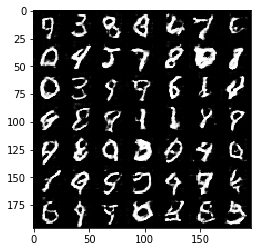

Epoch 1/2... Discriminator Loss: 2.2875... Generator Loss: 0.1429
Epoch 1/2... Discriminator Loss: 1.4035... Generator Loss: 0.3866
Epoch 1/2... Discriminator Loss: 1.0417... Generator Loss: 0.5976
Epoch 1/2... Discriminator Loss: 1.2878... Generator Loss: 0.4756
Epoch 1/2... Discriminator Loss: 1.6633... Generator Loss: 0.3135
Epoch 1/2... Discriminator Loss: 1.2727... Generator Loss: 0.5535
Epoch 1/2... Discriminator Loss: 1.9586... Generator Loss: 0.1883
Epoch 1/2... Discriminator Loss: 1.4676... Generator Loss: 0.3428
Epoch 1/2... Discriminator Loss: 1.2965... Generator Loss: 0.5444
Epoch 1/2... Discriminator Loss: 1.4909... Generator Loss: 0.3440


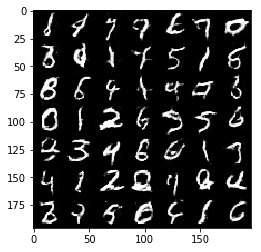

Epoch 1/2... Discriminator Loss: 1.1365... Generator Loss: 0.6346
Epoch 1/2... Discriminator Loss: 1.1180... Generator Loss: 0.7333
Epoch 1/2... Discriminator Loss: 1.6418... Generator Loss: 0.4569
Epoch 1/2... Discriminator Loss: 1.5742... Generator Loss: 0.3190
Epoch 1/2... Discriminator Loss: 1.8567... Generator Loss: 0.2436
Epoch 1/2... Discriminator Loss: 1.1872... Generator Loss: 0.5086
Epoch 1/2... Discriminator Loss: 1.2614... Generator Loss: 0.8937
Epoch 1/2... Discriminator Loss: 1.5759... Generator Loss: 0.2813
Epoch 1/2... Discriminator Loss: 1.7024... Generator Loss: 0.2499
Epoch 1/2... Discriminator Loss: 1.5800... Generator Loss: 0.2684


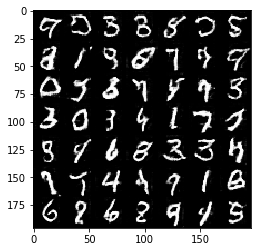

Epoch 1/2... Discriminator Loss: 1.3902... Generator Loss: 0.8086
Epoch 1/2... Discriminator Loss: 1.4686... Generator Loss: 0.4624
Epoch 1/2... Discriminator Loss: 1.7021... Generator Loss: 0.3337
Epoch 1/2... Discriminator Loss: 1.4976... Generator Loss: 0.4684
Epoch 1/2... Discriminator Loss: 1.1968... Generator Loss: 0.6680
Epoch 1/2... Discriminator Loss: 1.7181... Generator Loss: 0.2697
Epoch 1/2... Discriminator Loss: 1.4955... Generator Loss: 0.4854
Epoch 1/2... Discriminator Loss: 1.6904... Generator Loss: 0.2453
Epoch 1/2... Discriminator Loss: 1.1783... Generator Loss: 0.8648
Epoch 1/2... Discriminator Loss: 1.7831... Generator Loss: 0.3044


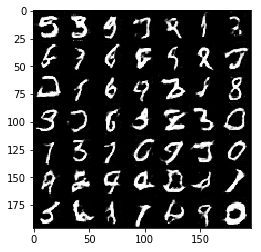

Epoch 1/2... Discriminator Loss: 1.4163... Generator Loss: 0.3718
Epoch 1/2... Discriminator Loss: 1.7660... Generator Loss: 0.2708
Epoch 1/2... Discriminator Loss: 1.0613... Generator Loss: 0.6306
Epoch 1/2... Discriminator Loss: 1.2956... Generator Loss: 0.4683
Epoch 1/2... Discriminator Loss: 1.3516... Generator Loss: 0.4816
Epoch 1/2... Discriminator Loss: 1.1559... Generator Loss: 1.0582
Epoch 1/2... Discriminator Loss: 1.0217... Generator Loss: 1.0133
Epoch 1/2... Discriminator Loss: 1.1591... Generator Loss: 0.6291
Epoch 1/2... Discriminator Loss: 2.0732... Generator Loss: 0.1608
Epoch 1/2... Discriminator Loss: 0.9396... Generator Loss: 0.9752


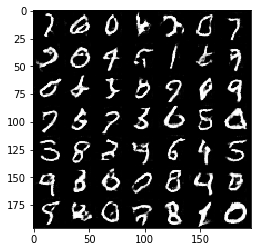

Epoch 1/2... Discriminator Loss: 1.8701... Generator Loss: 0.2344
Epoch 1/2... Discriminator Loss: 1.3259... Generator Loss: 0.3930
Epoch 1/2... Discriminator Loss: 1.0049... Generator Loss: 0.7743
Epoch 1/2... Discriminator Loss: 1.3933... Generator Loss: 0.4614
Epoch 1/2... Discriminator Loss: 1.8232... Generator Loss: 0.2407
Epoch 1/2... Discriminator Loss: 1.2572... Generator Loss: 0.5403
Epoch 1/2... Discriminator Loss: 1.0018... Generator Loss: 1.3087
Epoch 1/2... Discriminator Loss: 1.3896... Generator Loss: 0.3672
Epoch 1/2... Discriminator Loss: 1.9645... Generator Loss: 0.2018
Epoch 1/2... Discriminator Loss: 1.3958... Generator Loss: 0.3642


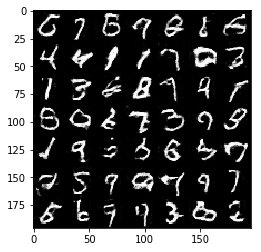

Epoch 1/2... Discriminator Loss: 1.1593... Generator Loss: 0.7210
Epoch 1/2... Discriminator Loss: 1.0008... Generator Loss: 0.6980
Epoch 1/2... Discriminator Loss: 0.9254... Generator Loss: 0.8732
Epoch 1/2... Discriminator Loss: 1.5032... Generator Loss: 0.4332
Epoch 1/2... Discriminator Loss: 2.0926... Generator Loss: 0.1581
Epoch 1/2... Discriminator Loss: 1.9732... Generator Loss: 0.2177
Epoch 1/2... Discriminator Loss: 1.5647... Generator Loss: 0.3391
Epoch 1/2... Discriminator Loss: 0.9115... Generator Loss: 0.7421
Epoch 1/2... Discriminator Loss: 1.0676... Generator Loss: 0.6883
Epoch 1/2... Discriminator Loss: 0.9996... Generator Loss: 0.9302


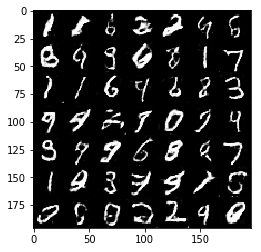

Epoch 1/2... Discriminator Loss: 1.2596... Generator Loss: 0.7008
Epoch 1/2... Discriminator Loss: 1.1888... Generator Loss: 0.6116
Epoch 1/2... Discriminator Loss: 1.2172... Generator Loss: 0.5569
Epoch 1/2... Discriminator Loss: 0.7969... Generator Loss: 0.9861
Epoch 1/2... Discriminator Loss: 1.3555... Generator Loss: 0.4072
Epoch 1/2... Discriminator Loss: 0.9123... Generator Loss: 0.8256
Epoch 1/2... Discriminator Loss: 0.9901... Generator Loss: 0.7360
Epoch 1/2... Discriminator Loss: 0.7008... Generator Loss: 1.5176
Epoch 1/2... Discriminator Loss: 2.0706... Generator Loss: 0.1983
Epoch 1/2... Discriminator Loss: 0.9975... Generator Loss: 0.8977


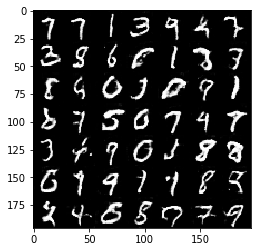

Epoch 1/2... Discriminator Loss: 1.3601... Generator Loss: 0.3977
Epoch 1/2... Discriminator Loss: 1.8661... Generator Loss: 0.2158
Epoch 1/2... Discriminator Loss: 1.3508... Generator Loss: 0.3979
Epoch 1/2... Discriminator Loss: 1.2431... Generator Loss: 0.5358
Epoch 1/2... Discriminator Loss: 1.4341... Generator Loss: 0.3922
Epoch 1/2... Discriminator Loss: 2.5108... Generator Loss: 0.1054
Epoch 1/2... Discriminator Loss: 1.8183... Generator Loss: 0.2590
Epoch 1/2... Discriminator Loss: 1.3861... Generator Loss: 0.3677
Epoch 1/2... Discriminator Loss: 1.3036... Generator Loss: 0.5060
Epoch 1/2... Discriminator Loss: 1.7946... Generator Loss: 0.2360


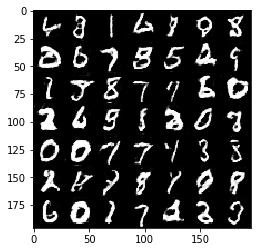

Epoch 1/2... Discriminator Loss: 1.6270... Generator Loss: 0.3215
Epoch 1/2... Discriminator Loss: 1.1024... Generator Loss: 0.5552
Epoch 1/2... Discriminator Loss: 1.0105... Generator Loss: 0.9201
Epoch 1/2... Discriminator Loss: 1.0470... Generator Loss: 0.7484
Epoch 1/2... Discriminator Loss: 1.0466... Generator Loss: 0.5729
Epoch 1/2... Discriminator Loss: 1.4084... Generator Loss: 0.3796
Epoch 1/2... Discriminator Loss: 1.1411... Generator Loss: 0.6150
Epoch 1/2... Discriminator Loss: 1.1031... Generator Loss: 0.6549
Epoch 1/2... Discriminator Loss: 1.2819... Generator Loss: 0.5296
Epoch 1/2... Discriminator Loss: 1.1745... Generator Loss: 0.6031


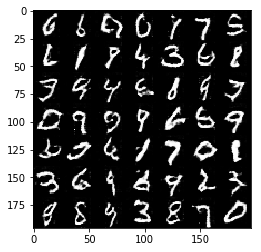

Epoch 1/2... Discriminator Loss: 1.4159... Generator Loss: 0.4070
Epoch 1/2... Discriminator Loss: 2.2139... Generator Loss: 0.1507
Epoch 1/2... Discriminator Loss: 1.4116... Generator Loss: 0.3791
Epoch 1/2... Discriminator Loss: 1.0207... Generator Loss: 0.9318
Epoch 1/2... Discriminator Loss: 2.3094... Generator Loss: 0.1378
Epoch 1/2... Discriminator Loss: 1.5287... Generator Loss: 0.3472
Epoch 1/2... Discriminator Loss: 1.1658... Generator Loss: 0.5329
Epoch 1/2... Discriminator Loss: 1.4228... Generator Loss: 0.7768
Epoch 1/2... Discriminator Loss: 1.6245... Generator Loss: 0.2906
Epoch 1/2... Discriminator Loss: 1.0807... Generator Loss: 0.6627


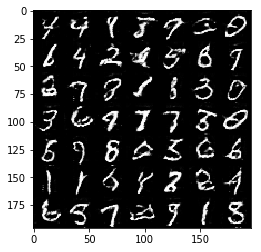

Epoch 1/2... Discriminator Loss: 1.2843... Generator Loss: 0.5791
Epoch 1/2... Discriminator Loss: 1.1055... Generator Loss: 0.5283
Epoch 1/2... Discriminator Loss: 1.1265... Generator Loss: 0.5940
Epoch 1/2... Discriminator Loss: 1.1833... Generator Loss: 0.8638
Epoch 1/2... Discriminator Loss: 1.3479... Generator Loss: 0.4164
Epoch 1/2... Discriminator Loss: 1.5052... Generator Loss: 0.3662
Epoch 1/2... Discriminator Loss: 1.3047... Generator Loss: 0.5018
Epoch 1/2... Discriminator Loss: 1.5214... Generator Loss: 0.3730
Epoch 1/2... Discriminator Loss: 1.6633... Generator Loss: 0.2861
Epoch 1/2... Discriminator Loss: 0.9207... Generator Loss: 0.8430


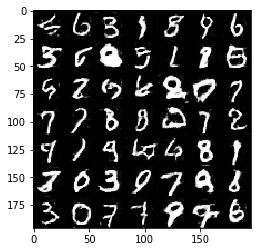

Epoch 1/2... Discriminator Loss: 1.0054... Generator Loss: 0.7632
Epoch 1/2... Discriminator Loss: 1.6311... Generator Loss: 0.3346
Epoch 1/2... Discriminator Loss: 1.9785... Generator Loss: 0.2154
Epoch 1/2... Discriminator Loss: 1.2829... Generator Loss: 0.4892
Epoch 1/2... Discriminator Loss: 2.2529... Generator Loss: 0.1506
Epoch 2/2... Discriminator Loss: 1.8830... Generator Loss: 0.2448
Epoch 2/2... Discriminator Loss: 1.4014... Generator Loss: 0.4044
Epoch 2/2... Discriminator Loss: 0.7548... Generator Loss: 0.9221
Epoch 2/2... Discriminator Loss: 1.2684... Generator Loss: 0.8214
Epoch 2/2... Discriminator Loss: 0.8556... Generator Loss: 0.8044


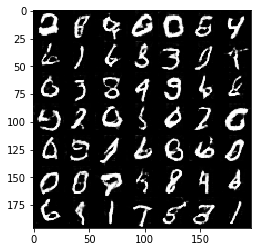

Epoch 2/2... Discriminator Loss: 2.0940... Generator Loss: 0.1719
Epoch 2/2... Discriminator Loss: 0.9576... Generator Loss: 0.9582
Epoch 2/2... Discriminator Loss: 1.5862... Generator Loss: 0.3681
Epoch 2/2... Discriminator Loss: 0.7429... Generator Loss: 1.0563
Epoch 2/2... Discriminator Loss: 1.1506... Generator Loss: 0.6757
Epoch 2/2... Discriminator Loss: 1.4168... Generator Loss: 0.4824
Epoch 2/2... Discriminator Loss: 1.2070... Generator Loss: 0.8170
Epoch 2/2... Discriminator Loss: 1.3689... Generator Loss: 0.4842
Epoch 2/2... Discriminator Loss: 1.3343... Generator Loss: 0.4541
Epoch 2/2... Discriminator Loss: 1.0072... Generator Loss: 0.8437


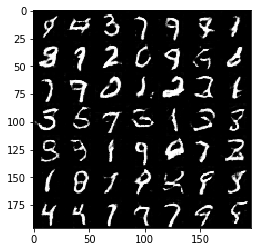

Epoch 2/2... Discriminator Loss: 1.3512... Generator Loss: 0.6623
Epoch 2/2... Discriminator Loss: 0.9972... Generator Loss: 0.8091
Epoch 2/2... Discriminator Loss: 1.2911... Generator Loss: 0.5264
Epoch 2/2... Discriminator Loss: 1.1721... Generator Loss: 0.6254
Epoch 2/2... Discriminator Loss: 0.9054... Generator Loss: 1.0462
Epoch 2/2... Discriminator Loss: 0.9775... Generator Loss: 1.9509
Epoch 2/2... Discriminator Loss: 1.2572... Generator Loss: 0.7540
Epoch 2/2... Discriminator Loss: 1.3536... Generator Loss: 0.4658
Epoch 2/2... Discriminator Loss: 1.2536... Generator Loss: 0.5471
Epoch 2/2... Discriminator Loss: 1.0372... Generator Loss: 0.6974


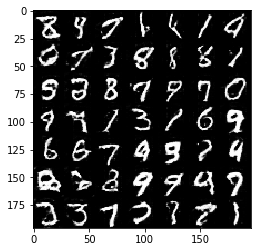

Epoch 2/2... Discriminator Loss: 1.6350... Generator Loss: 0.2895
Epoch 2/2... Discriminator Loss: 1.5897... Generator Loss: 0.2778
Epoch 2/2... Discriminator Loss: 1.1193... Generator Loss: 0.6056
Epoch 2/2... Discriminator Loss: 1.0406... Generator Loss: 0.7781
Epoch 2/2... Discriminator Loss: 0.9048... Generator Loss: 1.1087
Epoch 2/2... Discriminator Loss: 1.1467... Generator Loss: 0.5618
Epoch 2/2... Discriminator Loss: 1.1204... Generator Loss: 0.5971
Epoch 2/2... Discriminator Loss: 1.3561... Generator Loss: 0.5947
Epoch 2/2... Discriminator Loss: 1.9756... Generator Loss: 0.2267
Epoch 2/2... Discriminator Loss: 1.1241... Generator Loss: 0.7295


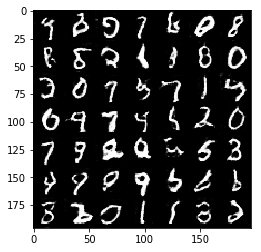

Epoch 2/2... Discriminator Loss: 0.7333... Generator Loss: 1.2052
Epoch 2/2... Discriminator Loss: 1.2973... Generator Loss: 0.4202
Epoch 2/2... Discriminator Loss: 1.0061... Generator Loss: 0.7631
Epoch 2/2... Discriminator Loss: 1.2986... Generator Loss: 0.5403
Epoch 2/2... Discriminator Loss: 1.7596... Generator Loss: 0.3399
Epoch 2/2... Discriminator Loss: 1.0976... Generator Loss: 0.5622
Epoch 2/2... Discriminator Loss: 1.8721... Generator Loss: 0.2202
Epoch 2/2... Discriminator Loss: 1.1893... Generator Loss: 0.5228
Epoch 2/2... Discriminator Loss: 1.4918... Generator Loss: 0.3724
Epoch 2/2... Discriminator Loss: 0.9619... Generator Loss: 1.0357


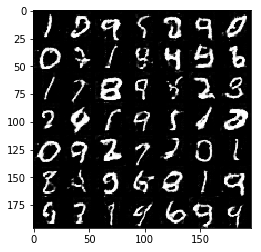

Epoch 2/2... Discriminator Loss: 1.1273... Generator Loss: 0.5288
Epoch 2/2... Discriminator Loss: 0.9228... Generator Loss: 1.0705
Epoch 2/2... Discriminator Loss: 0.9226... Generator Loss: 1.5151
Epoch 2/2... Discriminator Loss: 1.0365... Generator Loss: 0.6590
Epoch 2/2... Discriminator Loss: 1.4195... Generator Loss: 1.1546
Epoch 2/2... Discriminator Loss: 2.1747... Generator Loss: 0.1686
Epoch 2/2... Discriminator Loss: 1.3216... Generator Loss: 0.5467
Epoch 2/2... Discriminator Loss: 1.3840... Generator Loss: 0.4905
Epoch 2/2... Discriminator Loss: 0.8600... Generator Loss: 0.9271
Epoch 2/2... Discriminator Loss: 1.4422... Generator Loss: 0.7474


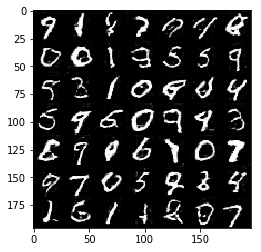

Epoch 2/2... Discriminator Loss: 1.1561... Generator Loss: 0.6017
Epoch 2/2... Discriminator Loss: 1.1232... Generator Loss: 0.5427
Epoch 2/2... Discriminator Loss: 1.2546... Generator Loss: 0.5272
Epoch 2/2... Discriminator Loss: 1.1189... Generator Loss: 0.6353
Epoch 2/2... Discriminator Loss: 1.6320... Generator Loss: 0.3323
Epoch 2/2... Discriminator Loss: 1.5272... Generator Loss: 0.3306
Epoch 2/2... Discriminator Loss: 1.9614... Generator Loss: 0.2222
Epoch 2/2... Discriminator Loss: 0.8962... Generator Loss: 0.8014
Epoch 2/2... Discriminator Loss: 1.4423... Generator Loss: 1.4405
Epoch 2/2... Discriminator Loss: 0.9962... Generator Loss: 0.7453


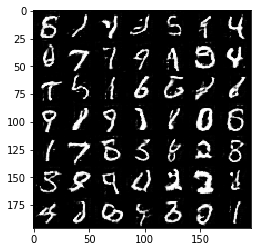

Epoch 2/2... Discriminator Loss: 1.6649... Generator Loss: 0.2929
Epoch 2/2... Discriminator Loss: 0.9725... Generator Loss: 0.7446
Epoch 2/2... Discriminator Loss: 1.6664... Generator Loss: 0.2692
Epoch 2/2... Discriminator Loss: 1.2216... Generator Loss: 0.5280
Epoch 2/2... Discriminator Loss: 0.7719... Generator Loss: 1.2366
Epoch 2/2... Discriminator Loss: 1.9982... Generator Loss: 0.2157
Epoch 2/2... Discriminator Loss: 1.2514... Generator Loss: 0.4763
Epoch 2/2... Discriminator Loss: 1.1471... Generator Loss: 0.6075
Epoch 2/2... Discriminator Loss: 1.6479... Generator Loss: 0.2934
Epoch 2/2... Discriminator Loss: 1.3149... Generator Loss: 0.4662


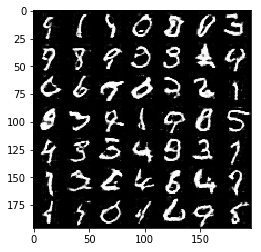

Epoch 2/2... Discriminator Loss: 1.6098... Generator Loss: 0.3530
Epoch 2/2... Discriminator Loss: 0.9843... Generator Loss: 0.8036
Epoch 2/2... Discriminator Loss: 0.8954... Generator Loss: 0.8771
Epoch 2/2... Discriminator Loss: 1.7279... Generator Loss: 0.2374
Epoch 2/2... Discriminator Loss: 1.2504... Generator Loss: 0.6223
Epoch 2/2... Discriminator Loss: 1.2861... Generator Loss: 0.4787
Epoch 2/2... Discriminator Loss: 1.1949... Generator Loss: 0.5374
Epoch 2/2... Discriminator Loss: 1.2487... Generator Loss: 0.4597
Epoch 2/2... Discriminator Loss: 1.2921... Generator Loss: 0.4618
Epoch 2/2... Discriminator Loss: 1.2272... Generator Loss: 0.5588


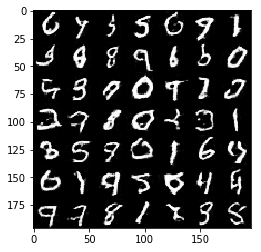

Epoch 2/2... Discriminator Loss: 1.0160... Generator Loss: 0.5985
Epoch 2/2... Discriminator Loss: 1.4667... Generator Loss: 0.3916
Epoch 2/2... Discriminator Loss: 1.3636... Generator Loss: 0.3899
Epoch 2/2... Discriminator Loss: 1.2214... Generator Loss: 0.5528
Epoch 2/2... Discriminator Loss: 1.5696... Generator Loss: 0.3275
Epoch 2/2... Discriminator Loss: 1.7937... Generator Loss: 0.3701
Epoch 2/2... Discriminator Loss: 1.0753... Generator Loss: 0.6202
Epoch 2/2... Discriminator Loss: 1.3193... Generator Loss: 0.4962
Epoch 2/2... Discriminator Loss: 1.2800... Generator Loss: 0.4961
Epoch 2/2... Discriminator Loss: 1.1146... Generator Loss: 0.9616


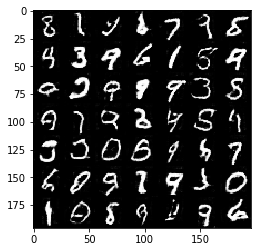

Epoch 2/2... Discriminator Loss: 2.0431... Generator Loss: 0.2687
Epoch 2/2... Discriminator Loss: 1.2599... Generator Loss: 0.5415
Epoch 2/2... Discriminator Loss: 1.0746... Generator Loss: 0.6543
Epoch 2/2... Discriminator Loss: 1.2788... Generator Loss: 0.4699
Epoch 2/2... Discriminator Loss: 1.3276... Generator Loss: 0.5802
Epoch 2/2... Discriminator Loss: 1.0684... Generator Loss: 0.7468
Epoch 2/2... Discriminator Loss: 0.9036... Generator Loss: 1.3610
Epoch 2/2... Discriminator Loss: 1.4898... Generator Loss: 0.4656
Epoch 2/2... Discriminator Loss: 1.8103... Generator Loss: 0.2386
Epoch 2/2... Discriminator Loss: 1.5794... Generator Loss: 0.2885


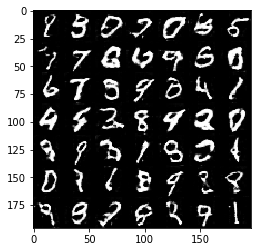

Epoch 2/2... Discriminator Loss: 1.0937... Generator Loss: 0.8794
Epoch 2/2... Discriminator Loss: 1.2818... Generator Loss: 0.5272
Epoch 2/2... Discriminator Loss: 1.1624... Generator Loss: 0.5139
Epoch 2/2... Discriminator Loss: 2.1279... Generator Loss: 0.2099
Epoch 2/2... Discriminator Loss: 1.4410... Generator Loss: 0.4263
Epoch 2/2... Discriminator Loss: 1.2547... Generator Loss: 0.5434
Epoch 2/2... Discriminator Loss: 1.3037... Generator Loss: 0.4744
Epoch 2/2... Discriminator Loss: 1.0303... Generator Loss: 0.7161
Epoch 2/2... Discriminator Loss: 1.6630... Generator Loss: 0.3215
Epoch 2/2... Discriminator Loss: 1.2608... Generator Loss: 0.5691


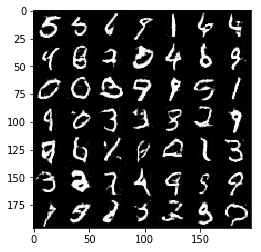

Epoch 2/2... Discriminator Loss: 1.5296... Generator Loss: 0.3779
Epoch 2/2... Discriminator Loss: 1.3694... Generator Loss: 0.3787
Epoch 2/2... Discriminator Loss: 1.7643... Generator Loss: 0.2475
Epoch 2/2... Discriminator Loss: 1.8013... Generator Loss: 0.2687
Epoch 2/2... Discriminator Loss: 1.1583... Generator Loss: 0.6892
Epoch 2/2... Discriminator Loss: 1.1796... Generator Loss: 0.5495
Epoch 2/2... Discriminator Loss: 1.4190... Generator Loss: 0.4454
Epoch 2/2... Discriminator Loss: 1.2589... Generator Loss: 0.4581
Epoch 2/2... Discriminator Loss: 1.5500... Generator Loss: 0.2918
Epoch 2/2... Discriminator Loss: 1.3433... Generator Loss: 0.3971


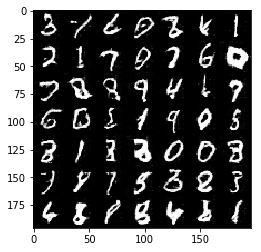

Epoch 2/2... Discriminator Loss: 1.4481... Generator Loss: 0.4215
Epoch 2/2... Discriminator Loss: 0.8353... Generator Loss: 0.8015
Epoch 2/2... Discriminator Loss: 1.3469... Generator Loss: 0.5024
Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.4474
Epoch 2/2... Discriminator Loss: 1.8301... Generator Loss: 0.2303
Epoch 2/2... Discriminator Loss: 1.0602... Generator Loss: 0.6322
Epoch 2/2... Discriminator Loss: 1.5524... Generator Loss: 0.3159
Epoch 2/2... Discriminator Loss: 2.1707... Generator Loss: 0.2231
Epoch 2/2... Discriminator Loss: 0.9020... Generator Loss: 0.7579
Epoch 2/2... Discriminator Loss: 1.2783... Generator Loss: 0.4795


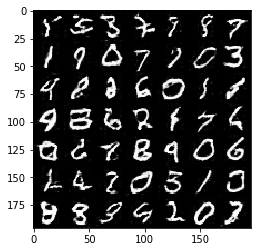

Epoch 2/2... Discriminator Loss: 1.4376... Generator Loss: 0.5551
Epoch 2/2... Discriminator Loss: 1.3010... Generator Loss: 0.4781
Epoch 2/2... Discriminator Loss: 1.1938... Generator Loss: 0.4747
Epoch 2/2... Discriminator Loss: 1.0830... Generator Loss: 0.7872
Epoch 2/2... Discriminator Loss: 1.7952... Generator Loss: 0.2615
Epoch 2/2... Discriminator Loss: 0.9634... Generator Loss: 0.7531
Epoch 2/2... Discriminator Loss: 1.0404... Generator Loss: 1.0787
Epoch 2/2... Discriminator Loss: 1.0898... Generator Loss: 0.7226
Epoch 2/2... Discriminator Loss: 1.4277... Generator Loss: 0.3625
Epoch 2/2... Discriminator Loss: 0.9869... Generator Loss: 0.8603


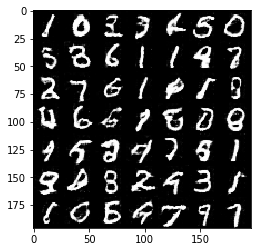

Epoch 2/2... Discriminator Loss: 1.9984... Generator Loss: 0.2154
Epoch 2/2... Discriminator Loss: 1.4751... Generator Loss: 0.3801
Epoch 2/2... Discriminator Loss: 1.5921... Generator Loss: 0.3153
Epoch 2/2... Discriminator Loss: 1.1290... Generator Loss: 0.5480
Epoch 2/2... Discriminator Loss: 1.6189... Generator Loss: 0.3142
Epoch 2/2... Discriminator Loss: 1.3731... Generator Loss: 0.6800
Epoch 2/2... Discriminator Loss: 1.1406... Generator Loss: 0.5526
Epoch 2/2... Discriminator Loss: 1.4819... Generator Loss: 0.3621
Epoch 2/2... Discriminator Loss: 1.7556... Generator Loss: 0.2370
Epoch 2/2... Discriminator Loss: 2.2687... Generator Loss: 0.1515


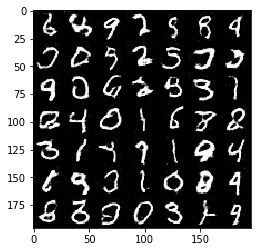

Epoch 2/2... Discriminator Loss: 1.3392... Generator Loss: 0.4598
Epoch 2/2... Discriminator Loss: 0.9906... Generator Loss: 0.7129
Epoch 2/2... Discriminator Loss: 2.6155... Generator Loss: 0.1200
Epoch 2/2... Discriminator Loss: 1.2677... Generator Loss: 0.4508
Epoch 2/2... Discriminator Loss: 0.8126... Generator Loss: 0.8255
Epoch 2/2... Discriminator Loss: 1.4261... Generator Loss: 0.3985
Epoch 2/2... Discriminator Loss: 1.1946... Generator Loss: 0.8800
Epoch 2/2... Discriminator Loss: 0.9649... Generator Loss: 0.7527
Epoch 2/2... Discriminator Loss: 1.2080... Generator Loss: 0.6629
Epoch 2/2... Discriminator Loss: 1.4404... Generator Loss: 0.9219


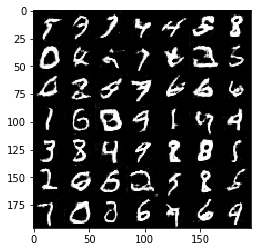

Epoch 2/2... Discriminator Loss: 1.2704... Generator Loss: 0.8171
Epoch 2/2... Discriminator Loss: 1.2359... Generator Loss: 0.5056
Epoch 2/2... Discriminator Loss: 0.6399... Generator Loss: 1.0431
Epoch 2/2... Discriminator Loss: 1.6825... Generator Loss: 0.3403
Epoch 2/2... Discriminator Loss: 0.9845... Generator Loss: 0.7227
Epoch 2/2... Discriminator Loss: 1.5959... Generator Loss: 0.3872
Epoch 2/2... Discriminator Loss: 1.2425... Generator Loss: 0.4833
Epoch 2/2... Discriminator Loss: 1.5106... Generator Loss: 0.4472
Epoch 2/2... Discriminator Loss: 0.7944... Generator Loss: 0.9237
Epoch 2/2... Discriminator Loss: 1.2982... Generator Loss: 0.4593


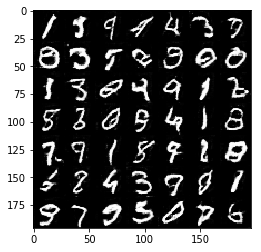

Epoch 2/2... Discriminator Loss: 1.7279... Generator Loss: 0.2300
Epoch 2/2... Discriminator Loss: 1.3750... Generator Loss: 0.4401
Epoch 2/2... Discriminator Loss: 1.6081... Generator Loss: 0.3557
Epoch 2/2... Discriminator Loss: 1.0622... Generator Loss: 0.6270
Epoch 2/2... Discriminator Loss: 1.5210... Generator Loss: 0.3726
Epoch 2/2... Discriminator Loss: 1.2524... Generator Loss: 0.5471
Epoch 2/2... Discriminator Loss: 1.6590... Generator Loss: 0.2797
Epoch 2/2... Discriminator Loss: 0.9950... Generator Loss: 0.6799
Epoch 2/2... Discriminator Loss: 1.3277... Generator Loss: 0.5832
Epoch 2/2... Discriminator Loss: 1.1638... Generator Loss: 0.5853


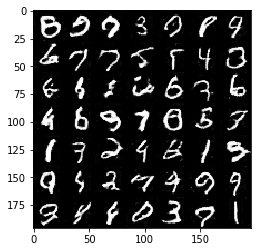

Epoch 2/2... Discriminator Loss: 1.5390... Generator Loss: 0.3729
Epoch 2/2... Discriminator Loss: 1.0480... Generator Loss: 0.5729
Epoch 2/2... Discriminator Loss: 1.2540... Generator Loss: 0.4072
Epoch 2/2... Discriminator Loss: 1.2572... Generator Loss: 0.5277
Epoch 2/2... Discriminator Loss: 1.0585... Generator Loss: 0.7470
Epoch 2/2... Discriminator Loss: 1.8230... Generator Loss: 0.3012
Epoch 2/2... Discriminator Loss: 1.2210... Generator Loss: 0.5984
Epoch 2/2... Discriminator Loss: 2.0336... Generator Loss: 0.2318
Epoch 2/2... Discriminator Loss: 0.8709... Generator Loss: 0.9554
Epoch 2/2... Discriminator Loss: 1.6379... Generator Loss: 0.2835


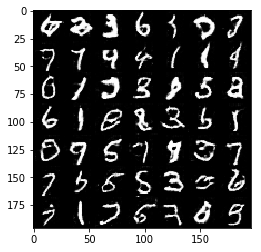

Epoch 2/2... Discriminator Loss: 2.5257... Generator Loss: 0.1360
Epoch 2/2... Discriminator Loss: 1.0463... Generator Loss: 0.7989
Epoch 2/2... Discriminator Loss: 1.0583... Generator Loss: 0.6323
Epoch 2/2... Discriminator Loss: 1.4803... Generator Loss: 0.3760
Epoch 2/2... Discriminator Loss: 1.0681... Generator Loss: 0.7004
Epoch 2/2... Discriminator Loss: 1.6120... Generator Loss: 0.3185
Epoch 2/2... Discriminator Loss: 0.9989... Generator Loss: 0.6636
Epoch 2/2... Discriminator Loss: 1.5417... Generator Loss: 0.3313
Epoch 2/2... Discriminator Loss: 0.9155... Generator Loss: 0.6663
Epoch 2/2... Discriminator Loss: 1.5690... Generator Loss: 0.3337


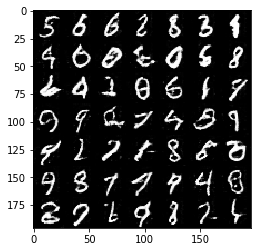

Epoch 2/2... Discriminator Loss: 1.3385... Generator Loss: 0.4652
Epoch 2/2... Discriminator Loss: 1.2506... Generator Loss: 0.6196
Epoch 2/2... Discriminator Loss: 0.9323... Generator Loss: 0.7455
Epoch 2/2... Discriminator Loss: 1.3198... Generator Loss: 0.4948
Epoch 2/2... Discriminator Loss: 1.2395... Generator Loss: 0.5872
Epoch 2/2... Discriminator Loss: 0.9997... Generator Loss: 0.6640
Epoch 2/2... Discriminator Loss: 1.1476... Generator Loss: 0.6636
Epoch 2/2... Discriminator Loss: 0.9462... Generator Loss: 0.7240
Epoch 2/2... Discriminator Loss: 1.7423... Generator Loss: 0.2911
Epoch 2/2... Discriminator Loss: 1.4154... Generator Loss: 0.4017


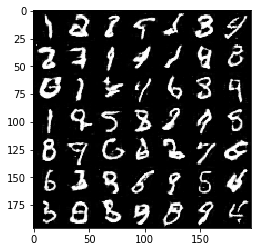

Epoch 2/2... Discriminator Loss: 1.2804... Generator Loss: 0.6312
Epoch 2/2... Discriminator Loss: 1.0930... Generator Loss: 0.6188
Epoch 2/2... Discriminator Loss: 1.8212... Generator Loss: 0.3194
Epoch 2/2... Discriminator Loss: 1.3011... Generator Loss: 0.4612
Epoch 2/2... Discriminator Loss: 0.9888... Generator Loss: 0.9610
Epoch 2/2... Discriminator Loss: 1.7756... Generator Loss: 0.2614
Epoch 2/2... Discriminator Loss: 1.6839... Generator Loss: 0.3994
Epoch 2/2... Discriminator Loss: 1.3666... Generator Loss: 0.4773
Epoch 2/2... Discriminator Loss: 1.7481... Generator Loss: 0.3170
Epoch 2/2... Discriminator Loss: 1.0978... Generator Loss: 0.7388


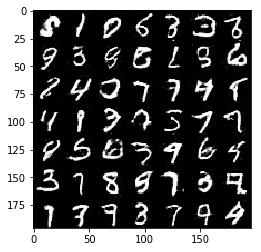

Epoch 2/2... Discriminator Loss: 1.0324... Generator Loss: 0.6295
Epoch 2/2... Discriminator Loss: 1.2727... Generator Loss: 0.5262
Epoch 2/2... Discriminator Loss: 0.7828... Generator Loss: 0.9419
Epoch 2/2... Discriminator Loss: 0.8704... Generator Loss: 1.1474
Epoch 2/2... Discriminator Loss: 1.5476... Generator Loss: 0.3654
Epoch 2/2... Discriminator Loss: 1.1880... Generator Loss: 0.5139
Epoch 2/2... Discriminator Loss: 1.3608... Generator Loss: 0.5826
Epoch 2/2... Discriminator Loss: 2.4552... Generator Loss: 0.1162
Epoch 2/2... Discriminator Loss: 1.2004... Generator Loss: 0.5444
Epoch 2/2... Discriminator Loss: 1.1196... Generator Loss: 0.6256


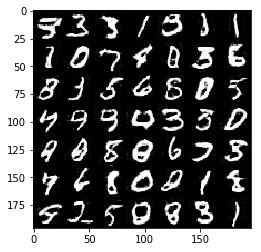

Epoch 2/2... Discriminator Loss: 1.3456... Generator Loss: 0.5111
Epoch 2/2... Discriminator Loss: 1.5493... Generator Loss: 0.3668
Epoch 2/2... Discriminator Loss: 2.1802... Generator Loss: 0.1569
Epoch 2/2... Discriminator Loss: 1.7306... Generator Loss: 0.2972
Epoch 2/2... Discriminator Loss: 1.3419... Generator Loss: 0.4076
Epoch 2/2... Discriminator Loss: 1.6005... Generator Loss: 0.4379
Epoch 2/2... Discriminator Loss: 1.3360... Generator Loss: 0.4294
Epoch 2/2... Discriminator Loss: 1.2278... Generator Loss: 0.4521
Epoch 2/2... Discriminator Loss: 1.6311... Generator Loss: 0.3253
Epoch 2/2... Discriminator Loss: 1.2998... Generator Loss: 0.5046


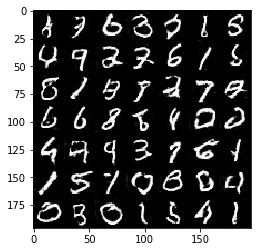

Epoch 2/2... Discriminator Loss: 1.5393... Generator Loss: 0.3471
Epoch 2/2... Discriminator Loss: 0.9077... Generator Loss: 0.7772
Epoch 2/2... Discriminator Loss: 1.6978... Generator Loss: 0.3592
Epoch 2/2... Discriminator Loss: 1.3225... Generator Loss: 0.4947
Epoch 2/2... Discriminator Loss: 1.3455... Generator Loss: 0.4408
Epoch 2/2... Discriminator Loss: 2.2942... Generator Loss: 0.1727
Epoch 2/2... Discriminator Loss: 1.0693... Generator Loss: 0.7120
Epoch 2/2... Discriminator Loss: 1.3419... Generator Loss: 0.6517
Epoch 2/2... Discriminator Loss: 1.2904... Generator Loss: 0.5853
Epoch 2/2... Discriminator Loss: 0.9755... Generator Loss: 0.9049


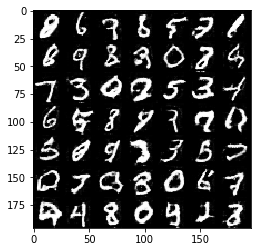

Epoch 2/2... Discriminator Loss: 1.1389... Generator Loss: 0.5734
Epoch 2/2... Discriminator Loss: 1.3215... Generator Loss: 0.5465
Epoch 2/2... Discriminator Loss: 0.7191... Generator Loss: 0.9624
Epoch 2/2... Discriminator Loss: 1.0337... Generator Loss: 0.6687
Epoch 2/2... Discriminator Loss: 1.1361... Generator Loss: 0.6213
Epoch 2/2... Discriminator Loss: 2.0810... Generator Loss: 0.2358
Epoch 2/2... Discriminator Loss: 0.7967... Generator Loss: 0.8430
Epoch 2/2... Discriminator Loss: 1.5816... Generator Loss: 0.3409
Epoch 2/2... Discriminator Loss: 0.5537... Generator Loss: 1.3107
Epoch 2/2... Discriminator Loss: 1.2651... Generator Loss: 0.4363


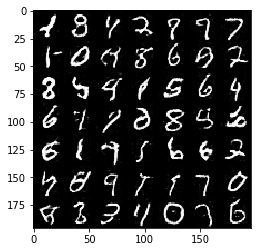

Epoch 2/2... Discriminator Loss: 1.9795... Generator Loss: 0.2203
Epoch 2/2... Discriminator Loss: 1.1804... Generator Loss: 0.5351
Epoch 2/2... Discriminator Loss: 1.3168... Generator Loss: 0.4250
Epoch 2/2... Discriminator Loss: 1.1950... Generator Loss: 0.5977
Epoch 2/2... Discriminator Loss: 1.0397... Generator Loss: 0.6753
Epoch 2/2... Discriminator Loss: 1.8305... Generator Loss: 0.2301
Epoch 2/2... Discriminator Loss: 0.8519... Generator Loss: 0.8190
Epoch 2/2... Discriminator Loss: 1.3228... Generator Loss: 0.4121
Epoch 2/2... Discriminator Loss: 1.0555... Generator Loss: 0.6572
Epoch 2/2... Discriminator Loss: 1.8968... Generator Loss: 0.2494


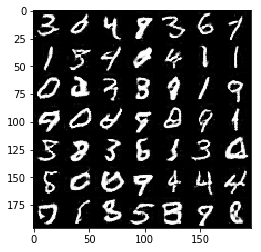

Epoch 2/2... Discriminator Loss: 1.1360... Generator Loss: 1.2748
Epoch 2/2... Discriminator Loss: 1.1780... Generator Loss: 0.7754
Epoch 2/2... Discriminator Loss: 1.5773... Generator Loss: 0.2942
Epoch 2/2... Discriminator Loss: 1.0861... Generator Loss: 0.6484
Epoch 2/2... Discriminator Loss: 1.5185... Generator Loss: 0.4280
Epoch 2/2... Discriminator Loss: 1.1126... Generator Loss: 0.6892
Epoch 2/2... Discriminator Loss: 1.5047... Generator Loss: 0.3714
Epoch 2/2... Discriminator Loss: 1.0919... Generator Loss: 0.6331
Epoch 2/2... Discriminator Loss: 2.5874... Generator Loss: 0.1045
Epoch 2/2... Discriminator Loss: 1.4145... Generator Loss: 1.1703


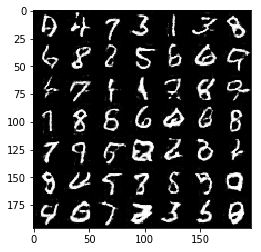

Epoch 2/2... Discriminator Loss: 1.5930... Generator Loss: 0.3794
Epoch 2/2... Discriminator Loss: 0.8805... Generator Loss: 0.7886
Epoch 2/2... Discriminator Loss: 1.6724... Generator Loss: 0.2656
Epoch 2/2... Discriminator Loss: 1.9605... Generator Loss: 0.2097
Epoch 2/2... Discriminator Loss: 1.8222... Generator Loss: 0.2515
Epoch 2/2... Discriminator Loss: 1.6985... Generator Loss: 0.2509
Epoch 2/2... Discriminator Loss: 1.3563... Generator Loss: 0.6088
Epoch 2/2... Discriminator Loss: 1.3440... Generator Loss: 0.4658
Epoch 2/2... Discriminator Loss: 1.5393... Generator Loss: 0.3402
Epoch 2/2... Discriminator Loss: 1.2633... Generator Loss: 0.5843


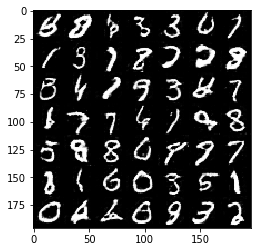

Epoch 2/2... Discriminator Loss: 0.9110... Generator Loss: 0.6989
Epoch 2/2... Discriminator Loss: 1.1507... Generator Loss: 0.5107
Epoch 2/2... Discriminator Loss: 0.8305... Generator Loss: 0.9551
Epoch 2/2... Discriminator Loss: 1.9034... Generator Loss: 0.1958
Epoch 2/2... Discriminator Loss: 1.3100... Generator Loss: 0.4589
Epoch 2/2... Discriminator Loss: 2.6188... Generator Loss: 0.1090
Epoch 2/2... Discriminator Loss: 1.2933... Generator Loss: 0.4197
Epoch 2/2... Discriminator Loss: 1.5337... Generator Loss: 0.3160
Epoch 2/2... Discriminator Loss: 1.2633... Generator Loss: 0.4734
Epoch 2/2... Discriminator Loss: 1.8422... Generator Loss: 0.2281


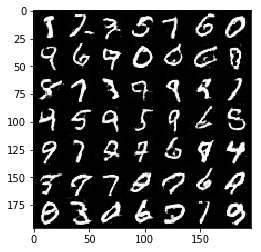

Epoch 2/2... Discriminator Loss: 1.2583... Generator Loss: 0.5856
Epoch 2/2... Discriminator Loss: 1.0862... Generator Loss: 0.5932
Epoch 2/2... Discriminator Loss: 1.9414... Generator Loss: 0.2579
Epoch 2/2... Discriminator Loss: 1.6687... Generator Loss: 0.2642
Epoch 2/2... Discriminator Loss: 1.4054... Generator Loss: 0.5287
Epoch 2/2... Discriminator Loss: 1.5878... Generator Loss: 0.3013
Epoch 2/2... Discriminator Loss: 0.9398... Generator Loss: 0.8244
Epoch 2/2... Discriminator Loss: 1.0111... Generator Loss: 0.7013
Epoch 2/2... Discriminator Loss: 2.5390... Generator Loss: 0.1135
Epoch 2/2... Discriminator Loss: 1.7943... Generator Loss: 0.2943


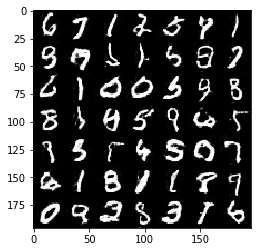

Epoch 2/2... Discriminator Loss: 1.9180... Generator Loss: 0.2450
Epoch 2/2... Discriminator Loss: 1.0804... Generator Loss: 0.8333
Epoch 2/2... Discriminator Loss: 1.4546... Generator Loss: 0.4128
Epoch 2/2... Discriminator Loss: 1.4305... Generator Loss: 0.3725
Epoch 2/2... Discriminator Loss: 1.5220... Generator Loss: 0.3600
Epoch 2/2... Discriminator Loss: 1.1549... Generator Loss: 0.5902
Epoch 2/2... Discriminator Loss: 0.9141... Generator Loss: 0.9211
Epoch 2/2... Discriminator Loss: 1.2793... Generator Loss: 0.6543
Epoch 2/2... Discriminator Loss: 1.0771... Generator Loss: 0.5627
Epoch 2/2... Discriminator Loss: 1.6958... Generator Loss: 0.3098


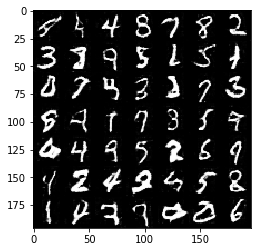

Epoch 2/2... Discriminator Loss: 1.7172... Generator Loss: 0.3088
Epoch 2/2... Discriminator Loss: 0.9869... Generator Loss: 0.7045
Epoch 2/2... Discriminator Loss: 0.9041... Generator Loss: 1.0276
Epoch 2/2... Discriminator Loss: 1.7700... Generator Loss: 0.2814
Epoch 2/2... Discriminator Loss: 1.4697... Generator Loss: 0.5714
Epoch 2/2... Discriminator Loss: 1.8406... Generator Loss: 0.2823
Epoch 2/2... Discriminator Loss: 2.3825... Generator Loss: 0.1459
Epoch 2/2... Discriminator Loss: 1.3550... Generator Loss: 0.4176
Epoch 2/2... Discriminator Loss: 1.2153... Generator Loss: 0.5474
Epoch 2/2... Discriminator Loss: 1.0954... Generator Loss: 0.6508


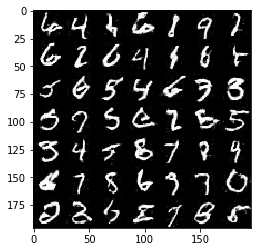

Epoch 2/2... Discriminator Loss: 1.7030... Generator Loss: 0.3185
Epoch 2/2... Discriminator Loss: 1.7687... Generator Loss: 0.2726
Epoch 2/2... Discriminator Loss: 2.0296... Generator Loss: 0.2392
Epoch 2/2... Discriminator Loss: 1.8140... Generator Loss: 0.4040
Epoch 2/2... Discriminator Loss: 2.2235... Generator Loss: 0.1930
Epoch 2/2... Discriminator Loss: 0.9612... Generator Loss: 0.7653
Epoch 2/2... Discriminator Loss: 1.0676... Generator Loss: 0.7243
Epoch 2/2... Discriminator Loss: 1.0276... Generator Loss: 0.9745
Epoch 2/2... Discriminator Loss: 0.8660... Generator Loss: 0.8420
Epoch 2/2... Discriminator Loss: 1.7694... Generator Loss: 0.2769


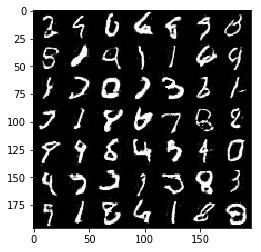

Epoch 2/2... Discriminator Loss: 1.4535... Generator Loss: 0.4083
Epoch 2/2... Discriminator Loss: 1.6625... Generator Loss: 0.3902
Epoch 2/2... Discriminator Loss: 0.9469... Generator Loss: 1.0077
Epoch 2/2... Discriminator Loss: 1.1147... Generator Loss: 0.9211
Epoch 2/2... Discriminator Loss: 1.4948... Generator Loss: 0.3686
Epoch 2/2... Discriminator Loss: 1.7164... Generator Loss: 0.3272
Epoch 2/2... Discriminator Loss: 1.5665... Generator Loss: 0.2990
Epoch 2/2... Discriminator Loss: 0.9830... Generator Loss: 0.8374
Epoch 2/2... Discriminator Loss: 1.6371... Generator Loss: 0.3337
Epoch 2/2... Discriminator Loss: 1.8492... Generator Loss: 0.2088


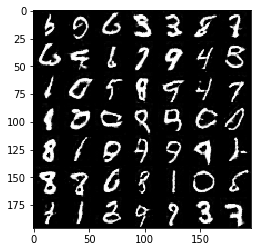

Epoch 2/2... Discriminator Loss: 1.5095... Generator Loss: 0.4068
Epoch 2/2... Discriminator Loss: 1.6001... Generator Loss: 0.3502
Epoch 2/2... Discriminator Loss: 1.2905... Generator Loss: 0.4063
Epoch 2/2... Discriminator Loss: 1.1500... Generator Loss: 0.9888
Epoch 2/2... Discriminator Loss: 0.7291... Generator Loss: 1.0733
Epoch 2/2... Discriminator Loss: 2.3732... Generator Loss: 0.1542
Epoch 2/2... Discriminator Loss: 1.7722... Generator Loss: 0.2748
Epoch 2/2... Discriminator Loss: 1.3176... Generator Loss: 0.5133
Epoch 2/2... Discriminator Loss: 1.6108... Generator Loss: 0.3680
Epoch 2/2... Discriminator Loss: 0.8746... Generator Loss: 0.7380


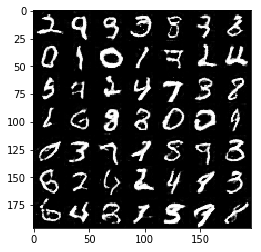

Epoch 2/2... Discriminator Loss: 1.0466... Generator Loss: 0.7123
Epoch 2/2... Discriminator Loss: 1.5776... Generator Loss: 0.3861
Epoch 2/2... Discriminator Loss: 2.1655... Generator Loss: 0.1797
Epoch 2/2... Discriminator Loss: 1.2767... Generator Loss: 0.4741
Epoch 2/2... Discriminator Loss: 1.2150... Generator Loss: 0.5956
Epoch 2/2... Discriminator Loss: 0.8449... Generator Loss: 0.7350
Epoch 2/2... Discriminator Loss: 1.0116... Generator Loss: 0.7433
Epoch 2/2... Discriminator Loss: 1.2457... Generator Loss: 0.5318
Epoch 2/2... Discriminator Loss: 1.3213... Generator Loss: 0.5307
Epoch 2/2... Discriminator Loss: 1.2250... Generator Loss: 0.7990


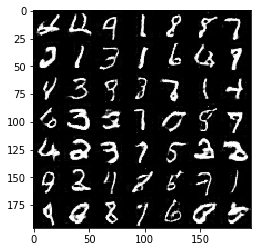

In [12]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 3.0353... Generator Loss: 0.0956
Epoch 1/1... Discriminator Loss: 3.1849... Generator Loss: 0.0822
Epoch 1/1... Discriminator Loss: 3.0506... Generator Loss: 0.0859
Epoch 1/1... Discriminator Loss: 2.9677... Generator Loss: 0.0990
Epoch 1/1... Discriminator Loss: 3.0484... Generator Loss: 0.0952
Epoch 1/1... Discriminator Loss: 3.0684... Generator Loss: 0.0955
Epoch 1/1... Discriminator Loss: 2.9839... Generator Loss: 0.1158
Epoch 1/1... Discriminator Loss: 2.9173... Generator Loss: 0.1276
Epoch 1/1... Discriminator Loss: 2.7477... Generator Loss: 0.1349
Epoch 1/1... Discriminator Loss: 2.9259... Generator Loss: 0.1252


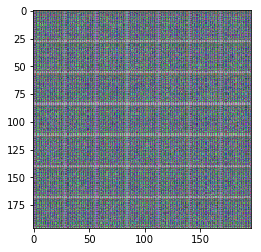

Epoch 1/1... Discriminator Loss: 2.8260... Generator Loss: 0.1242
Epoch 1/1... Discriminator Loss: 2.8599... Generator Loss: 0.1524
Epoch 1/1... Discriminator Loss: 2.7078... Generator Loss: 0.1698
Epoch 1/1... Discriminator Loss: 2.6509... Generator Loss: 0.1859
Epoch 1/1... Discriminator Loss: 2.4881... Generator Loss: 0.1823
Epoch 1/1... Discriminator Loss: 2.8497... Generator Loss: 0.1944
Epoch 1/1... Discriminator Loss: 2.6265... Generator Loss: 0.2284
Epoch 1/1... Discriminator Loss: 2.5766... Generator Loss: 0.2516
Epoch 1/1... Discriminator Loss: 2.2923... Generator Loss: 0.2788
Epoch 1/1... Discriminator Loss: 2.2211... Generator Loss: 0.2832


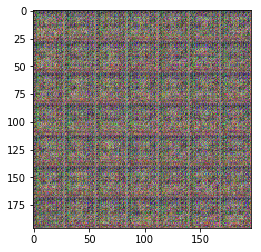

Epoch 1/1... Discriminator Loss: 2.7377... Generator Loss: 0.2846
Epoch 1/1... Discriminator Loss: 2.7769... Generator Loss: 0.3111
Epoch 1/1... Discriminator Loss: 2.5672... Generator Loss: 0.3136
Epoch 1/1... Discriminator Loss: 2.4479... Generator Loss: 0.3624
Epoch 1/1... Discriminator Loss: 2.7115... Generator Loss: 0.3976
Epoch 1/1... Discriminator Loss: 2.6935... Generator Loss: 0.3575
Epoch 1/1... Discriminator Loss: 2.6194... Generator Loss: 0.3284
Epoch 1/1... Discriminator Loss: 2.8181... Generator Loss: 0.3520
Epoch 1/1... Discriminator Loss: 2.3995... Generator Loss: 0.4006
Epoch 1/1... Discriminator Loss: 2.2766... Generator Loss: 0.4515


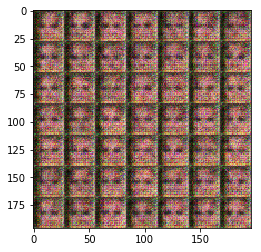

Epoch 1/1... Discriminator Loss: 2.0419... Generator Loss: 0.4424
Epoch 1/1... Discriminator Loss: 1.9809... Generator Loss: 0.3986
Epoch 1/1... Discriminator Loss: 2.0510... Generator Loss: 0.4207
Epoch 1/1... Discriminator Loss: 2.0342... Generator Loss: 0.4553
Epoch 1/1... Discriminator Loss: 1.9975... Generator Loss: 0.4298
Epoch 1/1... Discriminator Loss: 2.1816... Generator Loss: 0.4808
Epoch 1/1... Discriminator Loss: 1.9567... Generator Loss: 0.5020
Epoch 1/1... Discriminator Loss: 2.5433... Generator Loss: 0.4458
Epoch 1/1... Discriminator Loss: 2.2797... Generator Loss: 0.4609
Epoch 1/1... Discriminator Loss: 2.2964... Generator Loss: 0.5661


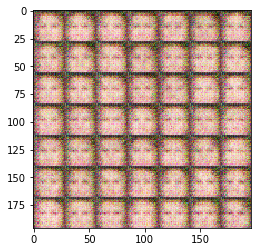

Epoch 1/1... Discriminator Loss: 2.2457... Generator Loss: 0.5722
Epoch 1/1... Discriminator Loss: 1.9639... Generator Loss: 0.5799
Epoch 1/1... Discriminator Loss: 2.2441... Generator Loss: 0.5324
Epoch 1/1... Discriminator Loss: 2.2543... Generator Loss: 0.5123
Epoch 1/1... Discriminator Loss: 2.3591... Generator Loss: 0.4777
Epoch 1/1... Discriminator Loss: 2.2222... Generator Loss: 0.5358
Epoch 1/1... Discriminator Loss: 2.3179... Generator Loss: 0.4126
Epoch 1/1... Discriminator Loss: 2.6901... Generator Loss: 0.4568
Epoch 1/1... Discriminator Loss: 2.7113... Generator Loss: 0.4594
Epoch 1/1... Discriminator Loss: 3.0433... Generator Loss: 0.3879


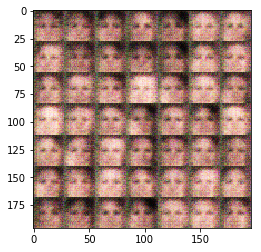

Epoch 1/1... Discriminator Loss: 3.0309... Generator Loss: 0.3871
Epoch 1/1... Discriminator Loss: 2.8587... Generator Loss: 0.3903
Epoch 1/1... Discriminator Loss: 2.8143... Generator Loss: 0.3660
Epoch 1/1... Discriminator Loss: 2.4514... Generator Loss: 0.4128
Epoch 1/1... Discriminator Loss: 2.2974... Generator Loss: 0.4732
Epoch 1/1... Discriminator Loss: 2.2642... Generator Loss: 0.4800
Epoch 1/1... Discriminator Loss: 2.2474... Generator Loss: 0.4728
Epoch 1/1... Discriminator Loss: 2.3815... Generator Loss: 0.4441
Epoch 1/1... Discriminator Loss: 2.2795... Generator Loss: 0.4856
Epoch 1/1... Discriminator Loss: 2.3783... Generator Loss: 0.4988


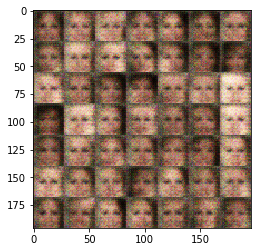

Epoch 1/1... Discriminator Loss: 2.4303... Generator Loss: 0.4398
Epoch 1/1... Discriminator Loss: 2.2413... Generator Loss: 0.4842
Epoch 1/1... Discriminator Loss: 2.3072... Generator Loss: 0.4175
Epoch 1/1... Discriminator Loss: 2.2188... Generator Loss: 0.4277
Epoch 1/1... Discriminator Loss: 2.3101... Generator Loss: 0.4170
Epoch 1/1... Discriminator Loss: 2.1187... Generator Loss: 0.4662
Epoch 1/1... Discriminator Loss: 2.1514... Generator Loss: 0.4781
Epoch 1/1... Discriminator Loss: 2.3113... Generator Loss: 0.4728
Epoch 1/1... Discriminator Loss: 2.1943... Generator Loss: 0.4646
Epoch 1/1... Discriminator Loss: 2.2259... Generator Loss: 0.4528


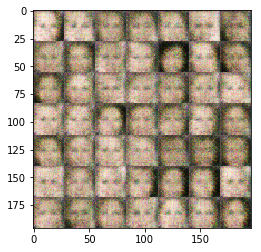

Epoch 1/1... Discriminator Loss: 2.1598... Generator Loss: 0.4776
Epoch 1/1... Discriminator Loss: 2.2029... Generator Loss: 0.4491
Epoch 1/1... Discriminator Loss: 2.3395... Generator Loss: 0.4042
Epoch 1/1... Discriminator Loss: 2.4702... Generator Loss: 0.3508
Epoch 1/1... Discriminator Loss: 2.6358... Generator Loss: 0.3026
Epoch 1/1... Discriminator Loss: 2.1089... Generator Loss: 0.3826
Epoch 1/1... Discriminator Loss: 2.2688... Generator Loss: 0.4211
Epoch 1/1... Discriminator Loss: 2.2269... Generator Loss: 0.3869
Epoch 1/1... Discriminator Loss: 2.4521... Generator Loss: 0.3924
Epoch 1/1... Discriminator Loss: 2.6144... Generator Loss: 0.3318


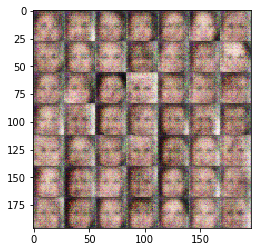

Epoch 1/1... Discriminator Loss: 2.4687... Generator Loss: 0.3809
Epoch 1/1... Discriminator Loss: 2.5142... Generator Loss: 0.3715
Epoch 1/1... Discriminator Loss: 2.4741... Generator Loss: 0.4191
Epoch 1/1... Discriminator Loss: 2.5078... Generator Loss: 0.3605
Epoch 1/1... Discriminator Loss: 2.6374... Generator Loss: 0.3150
Epoch 1/1... Discriminator Loss: 2.3920... Generator Loss: 0.3736
Epoch 1/1... Discriminator Loss: 2.1537... Generator Loss: 0.3781
Epoch 1/1... Discriminator Loss: 2.4810... Generator Loss: 0.3349
Epoch 1/1... Discriminator Loss: 2.3817... Generator Loss: 0.3509
Epoch 1/1... Discriminator Loss: 2.4267... Generator Loss: 0.3646


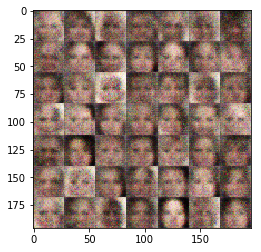

Epoch 1/1... Discriminator Loss: 2.3110... Generator Loss: 0.3937
Epoch 1/1... Discriminator Loss: 2.2313... Generator Loss: 0.3643
Epoch 1/1... Discriminator Loss: 2.3663... Generator Loss: 0.3815
Epoch 1/1... Discriminator Loss: 2.4960... Generator Loss: 0.3546
Epoch 1/1... Discriminator Loss: 2.3597... Generator Loss: 0.3653
Epoch 1/1... Discriminator Loss: 2.4504... Generator Loss: 0.3495
Epoch 1/1... Discriminator Loss: 2.3866... Generator Loss: 0.3808
Epoch 1/1... Discriminator Loss: 2.2500... Generator Loss: 0.4106
Epoch 1/1... Discriminator Loss: 2.3032... Generator Loss: 0.3856
Epoch 1/1... Discriminator Loss: 2.2993... Generator Loss: 0.4037


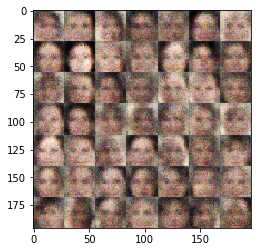

Epoch 1/1... Discriminator Loss: 2.2850... Generator Loss: 0.3652
Epoch 1/1... Discriminator Loss: 2.3255... Generator Loss: 0.3901
Epoch 1/1... Discriminator Loss: 2.2224... Generator Loss: 0.3931
Epoch 1/1... Discriminator Loss: 2.1826... Generator Loss: 0.3866
Epoch 1/1... Discriminator Loss: 2.2298... Generator Loss: 0.3916
Epoch 1/1... Discriminator Loss: 2.1895... Generator Loss: 0.3992
Epoch 1/1... Discriminator Loss: 2.3505... Generator Loss: 0.4083
Epoch 1/1... Discriminator Loss: 2.0451... Generator Loss: 0.4147
Epoch 1/1... Discriminator Loss: 2.1798... Generator Loss: 0.4222
Epoch 1/1... Discriminator Loss: 2.1444... Generator Loss: 0.4122


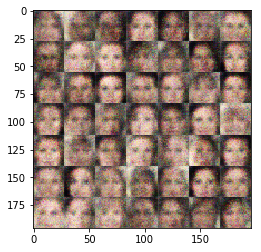

Epoch 1/1... Discriminator Loss: 2.1222... Generator Loss: 0.4474
Epoch 1/1... Discriminator Loss: 2.2368... Generator Loss: 0.4166
Epoch 1/1... Discriminator Loss: 2.1805... Generator Loss: 0.4215
Epoch 1/1... Discriminator Loss: 2.1906... Generator Loss: 0.4171
Epoch 1/1... Discriminator Loss: 2.3308... Generator Loss: 0.4150
Epoch 1/1... Discriminator Loss: 2.1493... Generator Loss: 0.4432
Epoch 1/1... Discriminator Loss: 2.1461... Generator Loss: 0.4439
Epoch 1/1... Discriminator Loss: 2.1796... Generator Loss: 0.4195
Epoch 1/1... Discriminator Loss: 2.1878... Generator Loss: 0.4428
Epoch 1/1... Discriminator Loss: 2.1593... Generator Loss: 0.4208


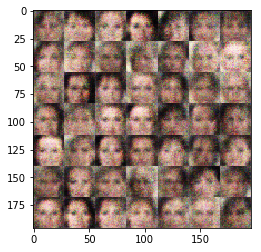

Epoch 1/1... Discriminator Loss: 2.1233... Generator Loss: 0.4578
Epoch 1/1... Discriminator Loss: 2.1072... Generator Loss: 0.4455
Epoch 1/1... Discriminator Loss: 2.1355... Generator Loss: 0.4391
Epoch 1/1... Discriminator Loss: 2.1212... Generator Loss: 0.4518
Epoch 1/1... Discriminator Loss: 2.1225... Generator Loss: 0.4234
Epoch 1/1... Discriminator Loss: 2.0502... Generator Loss: 0.4589
Epoch 1/1... Discriminator Loss: 2.0828... Generator Loss: 0.4284
Epoch 1/1... Discriminator Loss: 2.0264... Generator Loss: 0.4464
Epoch 1/1... Discriminator Loss: 2.1185... Generator Loss: 0.4437
Epoch 1/1... Discriminator Loss: 2.1539... Generator Loss: 0.4411


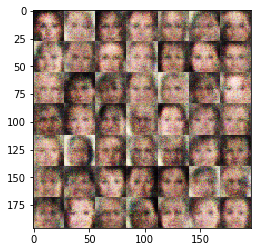

Epoch 1/1... Discriminator Loss: 1.9993... Generator Loss: 0.4746
Epoch 1/1... Discriminator Loss: 1.9452... Generator Loss: 0.4753
Epoch 1/1... Discriminator Loss: 1.9572... Generator Loss: 0.4732
Epoch 1/1... Discriminator Loss: 1.9986... Generator Loss: 0.4532
Epoch 1/1... Discriminator Loss: 2.0027... Generator Loss: 0.4433
Epoch 1/1... Discriminator Loss: 2.0278... Generator Loss: 0.4550
Epoch 1/1... Discriminator Loss: 1.9897... Generator Loss: 0.4720
Epoch 1/1... Discriminator Loss: 1.9993... Generator Loss: 0.4757
Epoch 1/1... Discriminator Loss: 1.9509... Generator Loss: 0.4788
Epoch 1/1... Discriminator Loss: 1.9176... Generator Loss: 0.4805


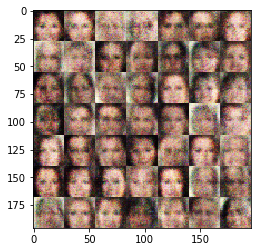

Epoch 1/1... Discriminator Loss: 1.9915... Generator Loss: 0.4501
Epoch 1/1... Discriminator Loss: 2.0360... Generator Loss: 0.4441
Epoch 1/1... Discriminator Loss: 1.8572... Generator Loss: 0.4589
Epoch 1/1... Discriminator Loss: 1.9589... Generator Loss: 0.4745
Epoch 1/1... Discriminator Loss: 2.0343... Generator Loss: 0.4916
Epoch 1/1... Discriminator Loss: 1.9922... Generator Loss: 0.4793
Epoch 1/1... Discriminator Loss: 2.0079... Generator Loss: 0.4734
Epoch 1/1... Discriminator Loss: 1.9757... Generator Loss: 0.4852
Epoch 1/1... Discriminator Loss: 1.9185... Generator Loss: 0.4971
Epoch 1/1... Discriminator Loss: 2.0250... Generator Loss: 0.5015


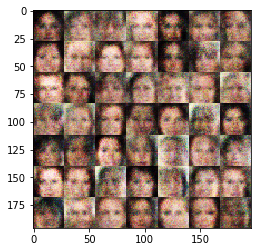

Epoch 1/1... Discriminator Loss: 1.9245... Generator Loss: 0.4762
Epoch 1/1... Discriminator Loss: 1.9416... Generator Loss: 0.5133
Epoch 1/1... Discriminator Loss: 1.9486... Generator Loss: 0.4852
Epoch 1/1... Discriminator Loss: 1.8260... Generator Loss: 0.4788
Epoch 1/1... Discriminator Loss: 1.9292... Generator Loss: 0.4848
Epoch 1/1... Discriminator Loss: 1.9970... Generator Loss: 0.5264
Epoch 1/1... Discriminator Loss: 1.9211... Generator Loss: 0.5122
Epoch 1/1... Discriminator Loss: 1.9487... Generator Loss: 0.4738
Epoch 1/1... Discriminator Loss: 1.8520... Generator Loss: 0.5164
Epoch 1/1... Discriminator Loss: 1.9405... Generator Loss: 0.5103


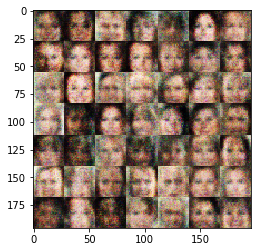

Epoch 1/1... Discriminator Loss: 1.8164... Generator Loss: 0.5316
Epoch 1/1... Discriminator Loss: 1.8601... Generator Loss: 0.4824
Epoch 1/1... Discriminator Loss: 1.9252... Generator Loss: 0.4689
Epoch 1/1... Discriminator Loss: 1.9115... Generator Loss: 0.4940
Epoch 1/1... Discriminator Loss: 1.8293... Generator Loss: 0.5077
Epoch 1/1... Discriminator Loss: 1.8903... Generator Loss: 0.4975
Epoch 1/1... Discriminator Loss: 1.8708... Generator Loss: 0.5274
Epoch 1/1... Discriminator Loss: 1.8484... Generator Loss: 0.5077
Epoch 1/1... Discriminator Loss: 1.8453... Generator Loss: 0.5121
Epoch 1/1... Discriminator Loss: 1.9055... Generator Loss: 0.4998


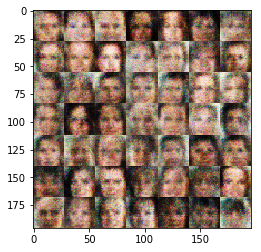

Epoch 1/1... Discriminator Loss: 1.9603... Generator Loss: 0.5109
Epoch 1/1... Discriminator Loss: 1.9372... Generator Loss: 0.5338
Epoch 1/1... Discriminator Loss: 1.7768... Generator Loss: 0.5195
Epoch 1/1... Discriminator Loss: 1.8202... Generator Loss: 0.5058
Epoch 1/1... Discriminator Loss: 1.9226... Generator Loss: 0.5242
Epoch 1/1... Discriminator Loss: 1.8237... Generator Loss: 0.5087
Epoch 1/1... Discriminator Loss: 1.8464... Generator Loss: 0.5017
Epoch 1/1... Discriminator Loss: 1.8458... Generator Loss: 0.5169
Epoch 1/1... Discriminator Loss: 1.8243... Generator Loss: 0.5047
Epoch 1/1... Discriminator Loss: 1.7972... Generator Loss: 0.5028


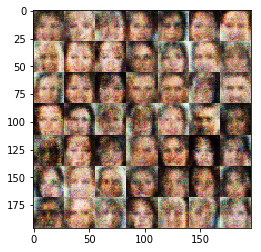

Epoch 1/1... Discriminator Loss: 1.8288... Generator Loss: 0.5165
Epoch 1/1... Discriminator Loss: 1.7973... Generator Loss: 0.5395
Epoch 1/1... Discriminator Loss: 1.8245... Generator Loss: 0.5201
Epoch 1/1... Discriminator Loss: 1.8207... Generator Loss: 0.5401
Epoch 1/1... Discriminator Loss: 1.8016... Generator Loss: 0.5437
Epoch 1/1... Discriminator Loss: 1.7699... Generator Loss: 0.5145
Epoch 1/1... Discriminator Loss: 1.8335... Generator Loss: 0.5381
Epoch 1/1... Discriminator Loss: 1.8897... Generator Loss: 0.5244
Epoch 1/1... Discriminator Loss: 1.8273... Generator Loss: 0.5334
Epoch 1/1... Discriminator Loss: 1.7806... Generator Loss: 0.5483


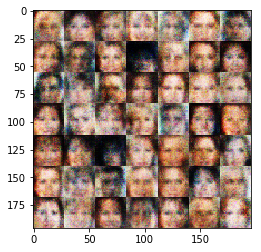

Epoch 1/1... Discriminator Loss: 1.7907... Generator Loss: 0.5287
Epoch 1/1... Discriminator Loss: 1.7692... Generator Loss: 0.5307
Epoch 1/1... Discriminator Loss: 1.8213... Generator Loss: 0.5337
Epoch 1/1... Discriminator Loss: 1.7362... Generator Loss: 0.5172
Epoch 1/1... Discriminator Loss: 1.7974... Generator Loss: 0.5137
Epoch 1/1... Discriminator Loss: 1.7585... Generator Loss: 0.5329
Epoch 1/1... Discriminator Loss: 1.7881... Generator Loss: 0.5208
Epoch 1/1... Discriminator Loss: 1.7684... Generator Loss: 0.5626
Epoch 1/1... Discriminator Loss: 1.7573... Generator Loss: 0.5561
Epoch 1/1... Discriminator Loss: 1.7512... Generator Loss: 0.5547


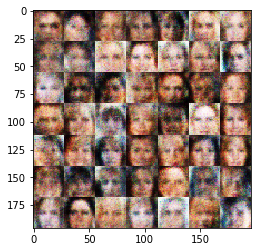

Epoch 1/1... Discriminator Loss: 1.8015... Generator Loss: 0.5172
Epoch 1/1... Discriminator Loss: 1.7131... Generator Loss: 0.5485
Epoch 1/1... Discriminator Loss: 1.7596... Generator Loss: 0.5559
Epoch 1/1... Discriminator Loss: 1.7535... Generator Loss: 0.5362
Epoch 1/1... Discriminator Loss: 1.7295... Generator Loss: 0.5566
Epoch 1/1... Discriminator Loss: 1.7853... Generator Loss: 0.5561
Epoch 1/1... Discriminator Loss: 1.7601... Generator Loss: 0.5308
Epoch 1/1... Discriminator Loss: 1.7512... Generator Loss: 0.5400
Epoch 1/1... Discriminator Loss: 1.7226... Generator Loss: 0.5626
Epoch 1/1... Discriminator Loss: 1.6761... Generator Loss: 0.5691


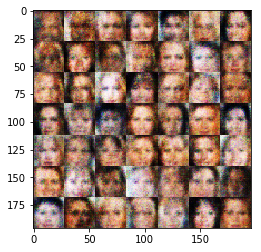

Epoch 1/1... Discriminator Loss: 1.7433... Generator Loss: 0.5482
Epoch 1/1... Discriminator Loss: 1.6693... Generator Loss: 0.5493
Epoch 1/1... Discriminator Loss: 1.7189... Generator Loss: 0.5327
Epoch 1/1... Discriminator Loss: 1.7277... Generator Loss: 0.5596
Epoch 1/1... Discriminator Loss: 1.7756... Generator Loss: 0.5335
Epoch 1/1... Discriminator Loss: 1.6990... Generator Loss: 0.5284
Epoch 1/1... Discriminator Loss: 1.7325... Generator Loss: 0.5395
Epoch 1/1... Discriminator Loss: 1.6267... Generator Loss: 0.5807
Epoch 1/1... Discriminator Loss: 1.7242... Generator Loss: 0.5612
Epoch 1/1... Discriminator Loss: 1.7074... Generator Loss: 0.5533


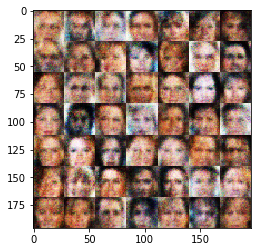

Epoch 1/1... Discriminator Loss: 1.6792... Generator Loss: 0.5597
Epoch 1/1... Discriminator Loss: 1.7045... Generator Loss: 0.5721
Epoch 1/1... Discriminator Loss: 1.7164... Generator Loss: 0.5774
Epoch 1/1... Discriminator Loss: 1.6748... Generator Loss: 0.5457
Epoch 1/1... Discriminator Loss: 1.7330... Generator Loss: 0.5623
Epoch 1/1... Discriminator Loss: 1.7212... Generator Loss: 0.5368
Epoch 1/1... Discriminator Loss: 1.7041... Generator Loss: 0.5639
Epoch 1/1... Discriminator Loss: 1.6699... Generator Loss: 0.5599
Epoch 1/1... Discriminator Loss: 1.7029... Generator Loss: 0.5380
Epoch 1/1... Discriminator Loss: 1.7315... Generator Loss: 0.5575


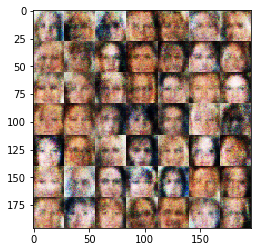

Epoch 1/1... Discriminator Loss: 1.7248... Generator Loss: 0.5703
Epoch 1/1... Discriminator Loss: 1.6718... Generator Loss: 0.5586
Epoch 1/1... Discriminator Loss: 1.7131... Generator Loss: 0.5850
Epoch 1/1... Discriminator Loss: 1.7332... Generator Loss: 0.5446
Epoch 1/1... Discriminator Loss: 1.7216... Generator Loss: 0.5848
Epoch 1/1... Discriminator Loss: 1.6550... Generator Loss: 0.5591
Epoch 1/1... Discriminator Loss: 1.7639... Generator Loss: 0.5466
Epoch 1/1... Discriminator Loss: 1.7333... Generator Loss: 0.5333
Epoch 1/1... Discriminator Loss: 1.7087... Generator Loss: 0.5451
Epoch 1/1... Discriminator Loss: 1.6986... Generator Loss: 0.5702


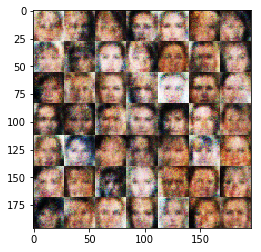

Epoch 1/1... Discriminator Loss: 1.7335... Generator Loss: 0.5500
Epoch 1/1... Discriminator Loss: 1.6606... Generator Loss: 0.5780
Epoch 1/1... Discriminator Loss: 1.6853... Generator Loss: 0.5809
Epoch 1/1... Discriminator Loss: 1.6642... Generator Loss: 0.5661
Epoch 1/1... Discriminator Loss: 1.6766... Generator Loss: 0.5699
Epoch 1/1... Discriminator Loss: 1.6220... Generator Loss: 0.5490
Epoch 1/1... Discriminator Loss: 1.6565... Generator Loss: 0.5623
Epoch 1/1... Discriminator Loss: 1.6718... Generator Loss: 0.5754
Epoch 1/1... Discriminator Loss: 1.6759... Generator Loss: 0.5756
Epoch 1/1... Discriminator Loss: 1.7123... Generator Loss: 0.5622


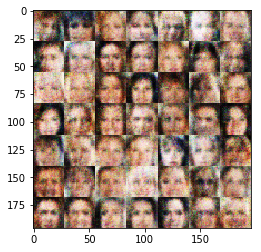

Epoch 1/1... Discriminator Loss: 1.6799... Generator Loss: 0.5781
Epoch 1/1... Discriminator Loss: 1.7223... Generator Loss: 0.5724
Epoch 1/1... Discriminator Loss: 1.6863... Generator Loss: 0.5734
Epoch 1/1... Discriminator Loss: 1.6942... Generator Loss: 0.5703
Epoch 1/1... Discriminator Loss: 1.6422... Generator Loss: 0.5791
Epoch 1/1... Discriminator Loss: 1.6410... Generator Loss: 0.5739
Epoch 1/1... Discriminator Loss: 1.6812... Generator Loss: 0.5620
Epoch 1/1... Discriminator Loss: 1.6837... Generator Loss: 0.5702
Epoch 1/1... Discriminator Loss: 1.6536... Generator Loss: 0.5798
Epoch 1/1... Discriminator Loss: 1.6851... Generator Loss: 0.5924


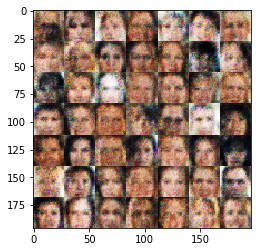

Epoch 1/1... Discriminator Loss: 1.6369... Generator Loss: 0.5913
Epoch 1/1... Discriminator Loss: 1.6524... Generator Loss: 0.5640
Epoch 1/1... Discriminator Loss: 1.6641... Generator Loss: 0.5673
Epoch 1/1... Discriminator Loss: 1.7171... Generator Loss: 0.5478
Epoch 1/1... Discriminator Loss: 1.6578... Generator Loss: 0.5847
Epoch 1/1... Discriminator Loss: 1.6566... Generator Loss: 0.5880
Epoch 1/1... Discriminator Loss: 1.6678... Generator Loss: 0.5672
Epoch 1/1... Discriminator Loss: 1.6459... Generator Loss: 0.5560
Epoch 1/1... Discriminator Loss: 1.6426... Generator Loss: 0.5477
Epoch 1/1... Discriminator Loss: 1.6603... Generator Loss: 0.5724


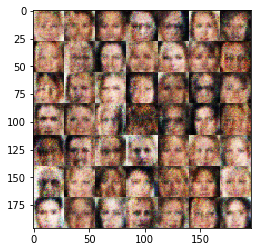

Epoch 1/1... Discriminator Loss: 1.5782... Generator Loss: 0.6043
Epoch 1/1... Discriminator Loss: 1.6483... Generator Loss: 0.5673
Epoch 1/1... Discriminator Loss: 1.6734... Generator Loss: 0.5568
Epoch 1/1... Discriminator Loss: 1.6288... Generator Loss: 0.5920
Epoch 1/1... Discriminator Loss: 1.6344... Generator Loss: 0.5783
Epoch 1/1... Discriminator Loss: 1.6499... Generator Loss: 0.5701
Epoch 1/1... Discriminator Loss: 1.6186... Generator Loss: 0.5876
Epoch 1/1... Discriminator Loss: 1.6673... Generator Loss: 0.5831
Epoch 1/1... Discriminator Loss: 1.6732... Generator Loss: 0.5922
Epoch 1/1... Discriminator Loss: 1.6342... Generator Loss: 0.5545


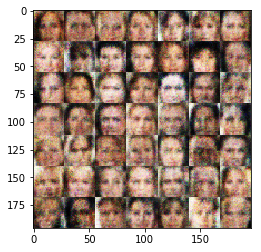

Epoch 1/1... Discriminator Loss: 1.6292... Generator Loss: 0.5824
Epoch 1/1... Discriminator Loss: 1.6331... Generator Loss: 0.5899
Epoch 1/1... Discriminator Loss: 1.6378... Generator Loss: 0.5999
Epoch 1/1... Discriminator Loss: 1.6594... Generator Loss: 0.5756
Epoch 1/1... Discriminator Loss: 1.6333... Generator Loss: 0.5752
Epoch 1/1... Discriminator Loss: 1.6350... Generator Loss: 0.5820
Epoch 1/1... Discriminator Loss: 1.6272... Generator Loss: 0.5760
Epoch 1/1... Discriminator Loss: 1.6442... Generator Loss: 0.5638
Epoch 1/1... Discriminator Loss: 1.5954... Generator Loss: 0.5830
Epoch 1/1... Discriminator Loss: 1.6289... Generator Loss: 0.5655


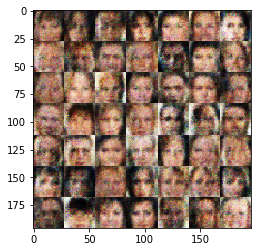

Epoch 1/1... Discriminator Loss: 1.6143... Generator Loss: 0.5875
Epoch 1/1... Discriminator Loss: 1.6287... Generator Loss: 0.5838
Epoch 1/1... Discriminator Loss: 1.6298... Generator Loss: 0.5799
Epoch 1/1... Discriminator Loss: 1.6007... Generator Loss: 0.5988
Epoch 1/1... Discriminator Loss: 1.5598... Generator Loss: 0.6090
Epoch 1/1... Discriminator Loss: 1.5897... Generator Loss: 0.5918
Epoch 1/1... Discriminator Loss: 1.5737... Generator Loss: 0.5772
Epoch 1/1... Discriminator Loss: 1.6578... Generator Loss: 0.5991
Epoch 1/1... Discriminator Loss: 1.6013... Generator Loss: 0.5816
Epoch 1/1... Discriminator Loss: 1.5912... Generator Loss: 0.5963


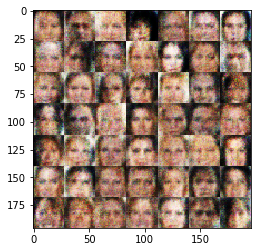

Epoch 1/1... Discriminator Loss: 1.6225... Generator Loss: 0.5801
Epoch 1/1... Discriminator Loss: 1.6580... Generator Loss: 0.5888
Epoch 1/1... Discriminator Loss: 1.6024... Generator Loss: 0.6192
Epoch 1/1... Discriminator Loss: 1.6019... Generator Loss: 0.5691
Epoch 1/1... Discriminator Loss: 1.5480... Generator Loss: 0.6091
Epoch 1/1... Discriminator Loss: 1.5977... Generator Loss: 0.5688
Epoch 1/1... Discriminator Loss: 1.5896... Generator Loss: 0.5947
Epoch 1/1... Discriminator Loss: 1.5655... Generator Loss: 0.6047
Epoch 1/1... Discriminator Loss: 1.6403... Generator Loss: 0.5989
Epoch 1/1... Discriminator Loss: 1.6128... Generator Loss: 0.6052


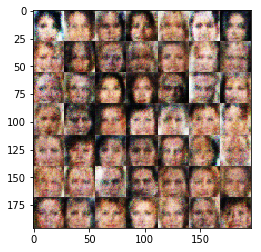

Epoch 1/1... Discriminator Loss: 1.6115... Generator Loss: 0.5767
Epoch 1/1... Discriminator Loss: 1.5977... Generator Loss: 0.5961
Epoch 1/1... Discriminator Loss: 1.5803... Generator Loss: 0.5891
Epoch 1/1... Discriminator Loss: 1.5665... Generator Loss: 0.5946
Epoch 1/1... Discriminator Loss: 1.6140... Generator Loss: 0.5895
Epoch 1/1... Discriminator Loss: 1.5957... Generator Loss: 0.6121


In [13]:
batch_size = 64
z_dim = 128
learning_rate = 0.00001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.